<a href="https://colab.research.google.com/github/JaminUbuntu/IBOK-Dissertation-Deepseek-CLIP/blob/main/lBOK_DeepSeek_%26_CLIP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Mon Aug 11 13:59:51 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   55C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!nvidia-smi --query-gpu=name,memory.total --format=csv

name, memory.total [MiB]
Tesla T4, 15360 MiB


# Setup DeepSeek VL2 Small (Stage 1)

In [ ]:
!pip install -e .

Obtaining file:///content
ERROR: file:///content does not appear to be a Python project: neither 'setup.py' nor 'pyproject.toml' found.


In [ ]:
!git clone https://huggingface.co/deepseek-ai/deepseek-vl2-tiny

Cloning into 'deepseek-vl2-tiny'...
remote: Enumerating objects: 40, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (36/36), done.
remote: Total 40 (delta 17), reused 0 (delta 0), pack-reused 4 (from 1)
Unpacking objects: 100% (40/40), 1.85 MiB | 1.13 MiB/s, done.
Encountered 1 file(s) that may not have been copied correctly on Windows:
	model-00001-of-000001.safetensors

See: `git lfs help smudge` for more details.


In [ ]:
ls

deepseek-vl2-tiny/  sample_data/


In [ ]:
cd deepseek-vl2-tiny

/content/deepseek-vl2-tiny


In [ ]:
ls

config.json                        README.md
model-00001-of-000001.safetensors  special_tokens_map.json
model.safetensors.index.json       tokenizer_config.json
processor_config.json              tokenizer.json


In [ ]:
!git clone https://github.com/deepseek-ai/DeepSeek-VL2.git

Cloning into 'DeepSeek-VL2'...
remote: Enumerating objects: 211, done.
remote: Counting objects: 100% (92/92), done.
remote: Compressing objects: 100% (51/51), done.
remote: Total 211 (delta 66), reused 41 (delta 41), pack-reused 119 (from 1)
Receiving objects: 100% (211/211), 31.04 MiB | 17.69 MiB/s, done.
Resolving deltas: 100% (95/95), done.


In [ ]:
ls

config.json                        README.md
DeepSeek-VL2/                      special_tokens_map.json
model-00001-of-000001.safetensors  tokenizer_config.json
model.safetensors.index.json       tokenizer.json
processor_config.json


In [ ]:
cd DeepSeek-VL2

/content/deepseek-vl2-tiny/DeepSeek-VL2


In [ ]:
ls

deepseek_vl2/           inference.py   Makefile        requirements.txt
DeepSeek_VL2_paper.pdf  LICENSE-CODE   pyproject.toml  web_demo.py*
images/                 LICENSE-MODEL  README.md


In [ ]:
pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.7/130.7 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.3/57.3 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 508.6/508.6 kB 13.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.6 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of xformers to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of xformers to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might need to provide the dependency resolver with stricter constraints to reduce runtime. See https://pip.pypa.io/warnings/backtracking for guidance. If you want to abort this run, press Ctrl + C.
INFO: pip is looking at multiple versions of torchvision to determine which version is compatible w

# Stage 2 - (Run this after restart)

In [ ]:
# This installs a more stable version of torch

!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu124

Looking in indexes: https://download.pytorch.org/whl/cu124
INFO: pip is looking at multiple versions of torchaudio to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 38.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 78.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 104.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 110.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 118.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.2 MB/s et

In [ ]:
pwd

'/content'

In [ ]:
ls

deepseek-vl2-tiny/  sample_data/


In [ ]:
cd deepseek-vl2-tiny/DeepSeek-VL2/

/content/deepseek-vl2-tiny/DeepSeek-VL2


In [ ]:
ls

deepseek_vl2/           inference.py   Makefile        requirements.txt
DeepSeek_VL2_paper.pdf  LICENSE-CODE   pyproject.toml  web_demo.py*
images/                 LICENSE-MODEL  README.md


In [ ]:
!pip install datasets --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 3.5 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sentence-transformers 5.0.0 requires transformers<5.0.0,>=4.41.0, but you have transformers 4.38.2 which is incompatible.
dataproc-spark-connect 0.8.3 requires websockets>=14.0, but you have websockets 11.0.3 which is incompatible.


# Setup CLIP

In [ ]:
!pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-941brfum
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-941brfum
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.7 MB/s eta 0:00:00
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369490 sha256=dd1288259f933d5e9b75b5ad3490e76d4706490b48f4a2bb1ae5d9f5b972be1c
  Stored in directory: /tmp/pip-ephem-wheel-cache-mh3srtnm/wheels/3f/7c/a4/9b490845988bf7a4db33674d52f709f088f64392063872eb9a
Successfully built clip


In [ ]:
import torch
import clip
from PIL import Image
from datasets import load_dataset

device = "cuda" if torch.cuda.is_available() else "cpu"

# Load CLIP ViT-L/14 or ViT-B/32 model and preprocess function
clip_model, clip_preprocess = clip.load("ViT-L/14", device=device)
clip_model.eval()

100%|███████████████████████████████████████| 890M/890M [01:16<00:00, 12.2MiB/s]


CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 1024, kernel_size=(14, 14), stride=(14, 14), bias=False)
    (ln_pre): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): Sequential(
        (0): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=1024, out_features=1024, bias=True)
          )
          (ln_1): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=1024, out_features=4096, bias=True)
            (gelu): QuickGELU()
            (c_proj): Linear(in_features=4096, out_features=1024, bias=True)
          )
          (ln_2): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
        )
        (1): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=1024, out_features=1024, bias=True)


# Loading the Dataset

In [ ]:
from datasets import load_dataset

# Load ROCOv2 dataset (radiology image-caption pairs)
def load_roco_subset(n_samples):

    print(f" Loading ROCOv2 subset with {n_samples} samples per split...")
    dataset = load_dataset("eltorio/ROCOv2-radiology")

    # Limit each split to first n_samples
    train_data = dataset['train'].select(range(min(n_samples, len(dataset['train']))))
    val_data   = dataset['validation'].select(range(min(n_samples, len(dataset['validation']))))
    test_data  = dataset['test'].select(range(min(n_samples, len(dataset['test']))))

    print(f" Loaded dataset: Train={len(train_data)}, Val={len(val_data)}, Test={len(test_data)}")
    return train_data, val_data, test_data

In [ ]:
# Load 1500 samples for testing

train_1000, val_1000, test_1000 = load_roco_subset(1500)

 Loading ROCOv2 subset with 1500 samples per split...


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md: 0.00B [00:00, ?B/s]

Resolving data files:   0%|          | 0/27 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/27 [00:00<?, ?it/s]

data/train-00000-of-00027.parquet:   0%|          | 0.00/497M [00:00<?, ?B/s]

data/train-00001-of-00027.parquet:   0%|          | 0.00/504M [00:00<?, ?B/s]

data/train-00002-of-00027.parquet:   0%|          | 0.00/490M [00:00<?, ?B/s]

data/train-00003-of-00027.parquet:   0%|          | 0.00/485M [00:00<?, ?B/s]

data/train-00004-of-00027.parquet:   0%|          | 0.00/510M [00:00<?, ?B/s]

data/train-00005-of-00027.parquet:   0%|          | 0.00/498M [00:00<?, ?B/s]

data/train-00006-of-00027.parquet:   0%|          | 0.00/532M [00:00<?, ?B/s]

data/train-00007-of-00027.parquet:   0%|          | 0.00/482M [00:00<?, ?B/s]

data/train-00008-of-00027.parquet:   0%|          | 0.00/497M [00:00<?, ?B/s]

data/train-00009-of-00027.parquet:   0%|          | 0.00/489M [00:00<?, ?B/s]

data/train-00010-of-00027.parquet:   0%|          | 0.00/484M [00:00<?, ?B/s]

data/train-00011-of-00027.parquet:   0%|          | 0.00/508M [00:00<?, ?B/s]

data/train-00012-of-00027.parquet:   0%|          | 0.00/490M [00:00<?, ?B/s]

data/train-00013-of-00027.parquet:   0%|          | 0.00/499M [00:00<?, ?B/s]

data/train-00014-of-00027.parquet:   0%|          | 0.00/499M [00:00<?, ?B/s]

data/train-00015-of-00027.parquet:   0%|          | 0.00/498M [00:00<?, ?B/s]

data/train-00016-of-00027.parquet:   0%|          | 0.00/496M [00:00<?, ?B/s]

data/train-00017-of-00027.parquet:   0%|          | 0.00/498M [00:00<?, ?B/s]

data/train-00018-of-00027.parquet:   0%|          | 0.00/525M [00:00<?, ?B/s]

data/train-00019-of-00027.parquet:   0%|          | 0.00/486M [00:00<?, ?B/s]

data/train-00020-of-00027.parquet:   0%|          | 0.00/483M [00:00<?, ?B/s]

data/train-00021-of-00027.parquet:   0%|          | 0.00/495M [00:00<?, ?B/s]

data/train-00022-of-00027.parquet:   0%|          | 0.00/493M [00:00<?, ?B/s]

data/train-00023-of-00027.parquet:   0%|          | 0.00/494M [00:00<?, ?B/s]

data/train-00024-of-00027.parquet:   0%|          | 0.00/500M [00:00<?, ?B/s]

data/train-00025-of-00027.parquet:   0%|          | 0.00/511M [00:00<?, ?B/s]

data/train-00026-of-00027.parquet:   0%|          | 0.00/517M [00:00<?, ?B/s]

data/validation-00000-of-00006.parquet:   0%|          | 0.00/444M [00:00<?, ?B/s]

data/validation-00001-of-00006.parquet:   0%|          | 0.00/424M [00:00<?, ?B/s]

data/validation-00002-of-00006.parquet:   0%|          | 0.00/428M [00:00<?, ?B/s]

data/validation-00003-of-00006.parquet:   0%|          | 0.00/426M [00:00<?, ?B/s]

data/validation-00004-of-00006.parquet:   0%|          | 0.00/431M [00:00<?, ?B/s]

data/validation-00005-of-00006.parquet:   0%|          | 0.00/422M [00:00<?, ?B/s]

data/test-00000-of-00006.parquet:   0%|          | 0.00/436M [00:00<?, ?B/s]

data/test-00001-of-00006.parquet:   0%|          | 0.00/426M [00:00<?, ?B/s]

data/test-00002-of-00006.parquet:   0%|          | 0.00/443M [00:00<?, ?B/s]

data/test-00003-of-00006.parquet:   0%|          | 0.00/432M [00:00<?, ?B/s]

data/test-00004-of-00006.parquet:   0%|          | 0.00/425M [00:00<?, ?B/s]

data/test-00005-of-00006.parquet:   0%|          | 0.00/423M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/59962 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/9904 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/9927 [00:00<?, ? examples/s]

Loading dataset shards:   0%|          | 0/27 [00:00<?, ?it/s]

 Loaded dataset: Train=1500, Val=1500, Test=1500


# Extract Clip Embeddings

In [ ]:
import torch
import torch.nn.functional as F
import clip  # for clip.tokenize

def extract_clip_embeddings(dataset_split, clip_model, clip_preprocess, batch_size=64, device=None):
    """
    Batched extractor for openai/clip.
    - dataset_split: HF split with keys ["image", "caption"]
    - clip_model, clip_preprocess: from clip.load("ViT-B/32", ...)
    - returns: (image_embeddings [N, D], caption_embeddings [N, D]) as NumPy arrays
    """
    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"

    clip_model.eval()
    model_dtype = clip_model.dtype  # fp16 on CUDA, fp32 on CPU

    img_chunks, txt_chunks = [], []

    with torch.no_grad():
        n = len(dataset_split)
        for start in range(0, n, batch_size):
            end = min(start + batch_size, n)
            batch = [dataset_split[i] for i in range(start, end)]

            # --- images ---
            imgs = [s["image"].convert("RGB") for s in batch]
            imgs = torch.stack([clip_preprocess(im) for im in imgs]).to(device).to(model_dtype)
            img_feat = clip_model.encode_image(imgs)
            img_feat = F.normalize(img_feat, p=2, dim=-1).cpu()
            img_chunks.append(img_feat)

            # --- texts ---
            caps = [s["caption"] for s in batch]
            tokens = clip.tokenize(caps, truncate=True).to(device)
            txt_feat = clip_model.encode_text(tokens)
            txt_feat = F.normalize(txt_feat, p=2, dim=-1).cpu()
            txt_chunks.append(txt_feat)

    image_embeddings = torch.cat(img_chunks, dim=0).numpy()
    caption_embeddings = torch.cat(txt_chunks, dim=0).numpy()
    return image_embeddings, caption_embeddings

In [ ]:
# Run on the test set
img_embeds_clip_baseline, txt_embeds_clip_baseline = extract_clip_embeddings(
    test_1000, clip_model,
    clip_preprocess,
    batch_size=64,
    device=device
)

print("Image embeddings shape:", img_embeds_clip_baseline.shape)  # ViT-L/14 -> [N, 768]
print("Text embeddings shape: ", txt_embeds_clip_baseline.shape)

Image embeddings shape: (1500, 768)
Text embeddings shape:  (1500, 768)


# CLIP Baseline Results

In [ ]:
import numpy as np

# Helper metrics (assume i-th text matches i-th image)
def compute_recall_at_k(S, k):
    n, m = S.shape
    kth = min(k-1, m-1)
    topk_idx = np.argpartition(-S, kth=kth, axis=1)[:, :k]   # indices of top-k (unordered)
    correct = np.arange(n)[:, None]
    return float(np.mean((topk_idx == correct).any(axis=1)))

def _ranks_from_sim(S):
    n, m = S.shape
    order = np.argsort(-S, axis=1)                           # desc
    inv = np.empty_like(order)
    inv[np.arange(n)[:, None], order] = np.arange(m)
    ranks = inv[np.arange(n), np.arange(n)] + 1              # 1-based rank of the diagonal match
    return ranks

def compute_mrr(S):
    ranks = _ranks_from_sim(S)
    return float(np.mean(1.0 / ranks))

def compute_mean_rank(S):
    ranks = _ranks_from_sim(S)
    return float(np.mean(ranks))

In [ ]:
# Similarity matrices

sims_t2i_clip_baseline = np.dot(txt_embeds_clip_baseline, img_embeds_clip_baseline.T)
sims_i2t_clip_baseline = np.dot(img_embeds_clip_baseline, txt_embeds_clip_baseline.T)

In [ ]:
# Calculate Recall Metrics

recall_k_values = [1, 3, 5, 10, 20]
metrics_clip_baseline = {"T2I": {}, "I2T": {}}

In [ ]:
# Compute Recall@K for both directions

for k in recall_k_values:
    metrics_clip_baseline["T2I"][f"Recall@{k}"] = compute_recall_at_k(sims_t2i_clip_baseline, k)
    metrics_clip_baseline["I2T"][f"Recall@{k}"] = compute_recall_at_k(sims_i2t_clip_baseline, k)

In [ ]:
# Compute MRR and Mean Rank for both directions
metrics_clip_baseline["T2I"]["MRR"] = compute_mrr(sims_t2i_clip_baseline)
metrics_clip_baseline["I2T"]["MRR"] = compute_mrr(sims_i2t_clip_baseline)
metrics_clip_baseline["T2I"]["Mean Rank"] = compute_mean_rank(sims_t2i_clip_baseline)
metrics_clip_baseline["I2T"]["Mean Rank"] = compute_mean_rank(sims_i2t_clip_baseline)

In [ ]:
# Display results (two-section style)
print("\n CLIP Baseline Results (Text -> Image):")
for k, v in metrics_clip_baseline["T2I"].items():
    print(f"{k:<12}: {v:.4f}")

print("\n CLIP Baseline Results (Image -> Text):")
for k, v in metrics_clip_baseline["I2T"].items():
    print(f"{k:<12}: {v:.4f}")


 CLIP Baseline Results (Text -> Image):
Recall@1    : 0.0780
Recall@3    : 0.1367
Recall@5    : 0.1853
Recall@10   : 0.2773
Recall@20   : 0.3927
MRR         : 0.1447
Mean Rank   : 96.7513

 CLIP Baseline Results (Image -> Text):
Recall@1    : 0.0747
Recall@3    : 0.1460
Recall@5    : 0.1893
Recall@10   : 0.2720
Recall@20   : 0.4033
MRR         : 0.1442
Mean Rank   : 98.6513


# CLIP Baseline Visualization

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import torch

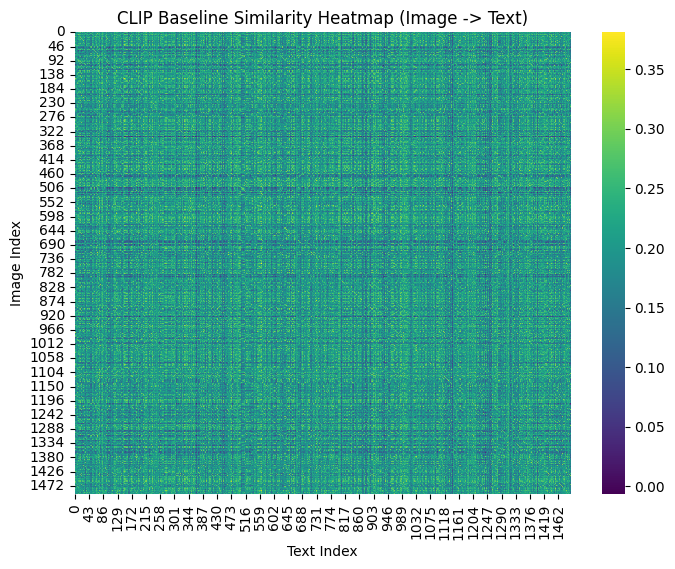

In [ ]:
#  Similarity Heatmap (Image -> Text)

plt.figure(figsize=(8, 6))
sns.heatmap(sims_i2t_clip_baseline, cmap="viridis")
plt.title("CLIP Baseline Similarity Heatmap (Image -> Text)")
plt.xlabel("Text Index")
plt.ylabel("Image Index")
plt.show()

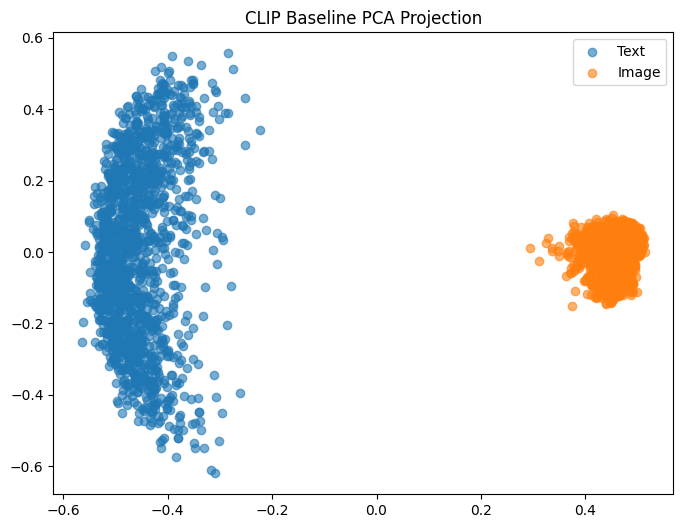

In [ ]:
# PCA Projection

def plot_pca(img_embeds, txt_embeds, title):
    all_embeds = np.vstack([img_embeds, txt_embeds])
    labels = ["Image"] * img_embeds.shape[0] + ["Text"] * txt_embeds.shape[0]

    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(all_embeds)

    plt.figure(figsize=(8, 6))
    for label in set(labels):
        idxs = [i for i, l in enumerate(labels) if l == label]
        plt.scatter(pca_result[idxs, 0], pca_result[idxs, 1], label=label, alpha=0.6)
    plt.legend()
    plt.title(title)
    plt.show()

plot_pca(img_embeds_clip_baseline, txt_embeds_clip_baseline, "CLIP Baseline PCA Projection")


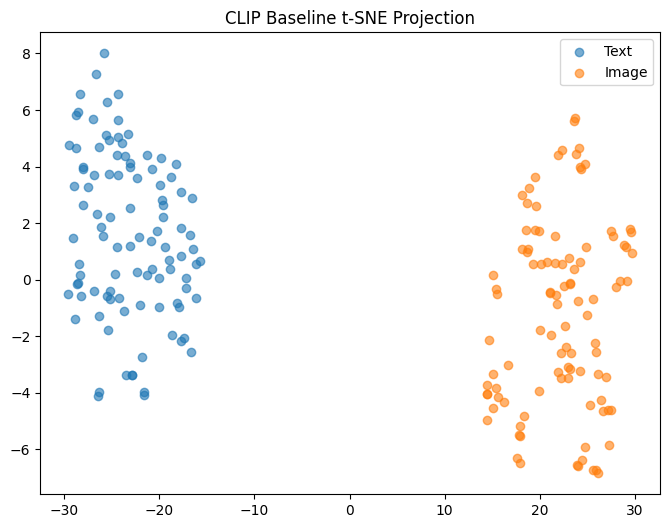

In [ ]:
# t-SNE Projection

def plot_tsne(img_embeds, txt_embeds, title, sample_size=100):
    img_sample = img_embeds[:sample_size]
    txt_sample = txt_embeds[:sample_size]
    all_embeds = np.vstack([img_sample, txt_sample])
    labels = ["Image"] * len(img_sample) + ["Text"] * len(txt_sample)

    tsne = TSNE(n_components=2, perplexity=30, random_state=42)
    tsne_result = tsne.fit_transform(all_embeds)

    plt.figure(figsize=(8, 6))
    for label in set(labels):
        idxs = [i for i, l in enumerate(labels) if l == label]
        plt.scatter(tsne_result[idxs, 0], tsne_result[idxs, 1], label=label, alpha=0.6)
    plt.legend()
    plt.title(title)
    plt.show()

plot_tsne(img_embeds_clip_baseline, txt_embeds_clip_baseline, "CLIP Baseline t-SNE Projection")

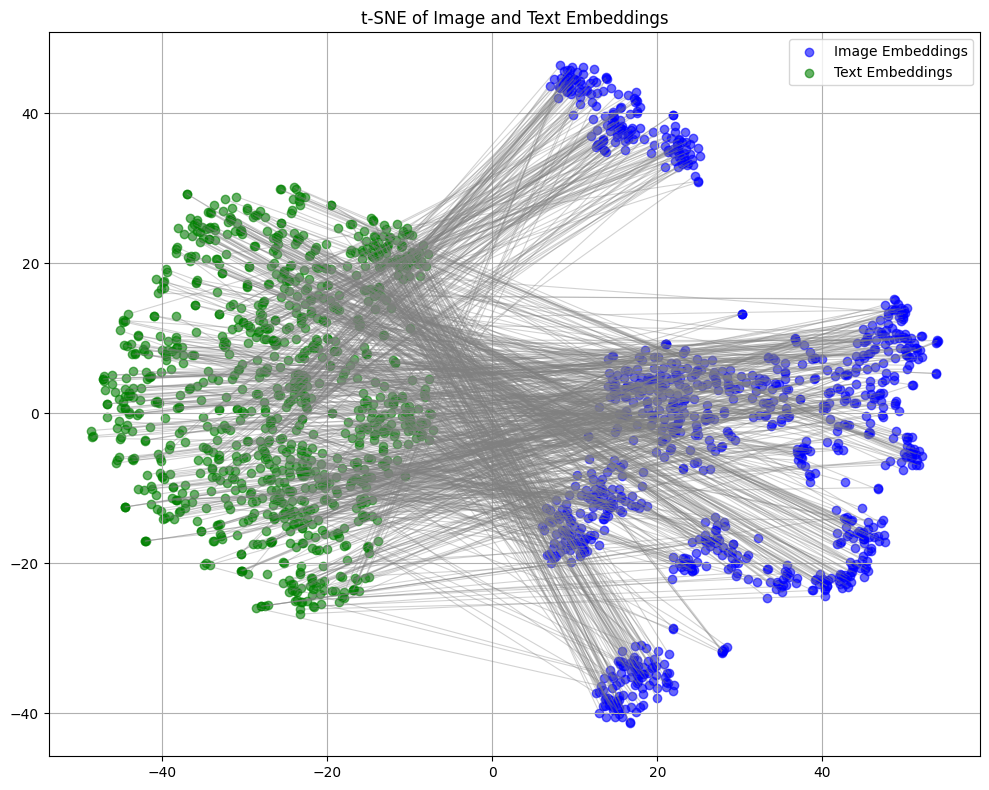

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import numpy as np

def tsne_plot(image_embs, text_embs, num_points=100, perplexity=30, random_state=42):
    # accept numpy or torch tensors
    def to_numpy(x):
        if isinstance(x, np.ndarray):
            return x
        try:
            import torch
            if isinstance(x, torch.Tensor):
                return x.detach().cpu().numpy()
        except Exception:
            pass
        return np.asarray(x)

    img = to_numpy(image_embs)
    txt = to_numpy(text_embs)

    # same-sized slice
    n = min(num_points, len(img), len(txt))
    img_vecs = img[:n]
    txt_vecs = txt[:n]

    # stack and run t-SNE (cosine metric, PCA init)
    all_vecs = np.vstack([img_vecs, txt_vecs])
    eff_perp = min(perplexity, all_vecs.shape[0] - 1)  # keep valid
    tsne = TSNE(n_components=2, perplexity=eff_perp, metric='cosine', init='pca', random_state=random_state)
    reduced = tsne.fit_transform(all_vecs)

    # split back
    reduced_img = reduced[:n]
    reduced_txt = reduced[n:]

    # plot
    fig, ax = plt.subplots(figsize=(10, 8))
    ax.scatter(reduced_img[:, 0], reduced_img[:, 1], c='blue',  label='Image Embeddings', alpha=0.6)
    ax.scatter(reduced_txt[:, 0], reduced_txt[:, 1], c='green', label='Text Embeddings', alpha=0.6)

    # draw lines between matched pairs
    segments = np.stack([reduced_img, reduced_txt], axis=1)  # [n, 2, 2]
    lc = LineCollection(segments, colors="gray", linewidths=0.8, alpha=0.35)
    ax.add_collection(lc)

    ax.set_title("t-SNE of Image and Text Embeddings")
    ax.legend()
    ax.grid(True)
    fig.tight_layout()
    plt.show()

# call with your variables
tsne_plot(img_embeds_clip_baseline, txt_embeds_clip_baseline, num_points=1000)

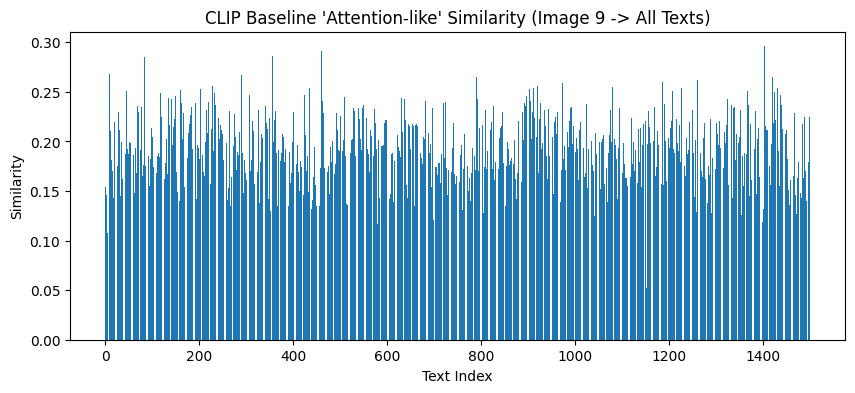

In [ ]:
# Attention-like Similarity for one image

example_img_idx = 9
example_similarities = sims_i2t_clip_baseline[example_img_idx]

plt.figure(figsize=(10, 4))
plt.bar(range(len(example_similarities)), example_similarities)
plt.title(f"CLIP Baseline 'Attention-like' Similarity (Image {example_img_idx} -> All Texts)")
plt.xlabel("Text Index")
plt.ylabel("Similarity")
plt.show()

# Attention Heatmap per Image/Caption (CLIP)

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# --- core: gradient-based heatmap (text-conditioned) ---
def clip_text_image_heatmap(pil_image, text, clip_model, clip_preprocess, device="cuda", noise_samples=0, noise_std=0.0):
    """
    Returns a heatmap (H, W) in [0,1] aligned to the original image size.
    Works with openai/clip.
    """
    clip_model.eval()
    model_dtype = clip_model.dtype
    img_t = clip_preprocess(pil_image).unsqueeze(0).to(device).to(model_dtype)
    tokens = clip.tokenize([text], truncate=True).to(device)

    # accumulate gradients (SmoothGrad-style) if noise_samples > 0
    grad_accum = torch.zeros_like(img_t, dtype=torch.float32)

    for _ in range(max(1, noise_samples + 1)):
        img_in = img_t.clone().detach().requires_grad_(True)
        if noise_samples > 0 and noise_std > 0:
            img_in = img_in + noise_std * torch.randn_like(img_in)

        # forward
        img_feat = clip_model.encode_image(img_in)
        txt_feat = clip_model.encode_text(tokens)
        img_feat = F.normalize(img_feat, p=2, dim=-1)
        txt_feat = F.normalize(txt_feat, p=2, dim=-1)

        # similarity score (scalar)
        sim = (img_feat * txt_feat).sum()

        # backward to image
        clip_model.zero_grad(set_to_none=True)
        if img_in.grad is not None:
            img_in.grad.zero_()
        sim.backward(retain_graph=False)

        grad_accum += img_in.grad.detach().float()

    grad = grad_accum / max(1, noise_samples + 1)

    # channel-aggregate → [H, W]
    sal = grad.abs().mean(dim=1)[0]  # L1 over channels
    sal = (sal - sal.min()) / (sal.max() - sal.min() + 1e-8)

    # resize to original image size
    sal_np = sal.cpu().numpy()
    sal_img = Image.fromarray((sal_np * 255).astype(np.uint8)).resize(pil_image.size, resample=Image.BILINEAR)
    sal_np = np.asarray(sal_img) / 255.0
    return sal_np

# --- helper: overlay heatmap on the image ---
def show_heatmap_on_image(pil_image, heatmap, alpha=0.35, cmap="jet", title=None):
    plt.figure(figsize=(6, 6))
    plt.imshow(pil_image)
    plt.imshow(heatmap, cmap=cmap, alpha=alpha, interpolation="bilinear")
    plt.axis("off")
    if title:
        plt.title(title)
    plt.tight_layout()
    plt.show()

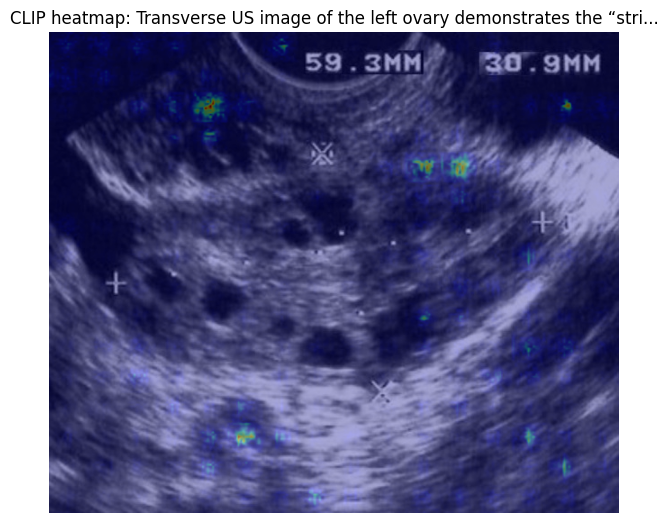

In [ ]:
# pick a sample from teh ROCO split
idx = 10
pil_img = test_1000[idx]["image"].convert("RGB")
caption = test_1000[idx]["caption"]

heat = clip_text_image_heatmap(
    pil_img, caption,
    clip_model, clip_preprocess,
    device=device,
    noise_samples=0,   # try 10 for smoother maps
    noise_std=0.05
)

show_heatmap_on_image(pil_img, heat, alpha=0.35, title=f"CLIP heatmap: {caption[:60]}...")

**Saving Metrics**

In [ ]:
# Save retrieval examples
import pickle

metrics_file_baseline = f"clip_baseline_metrics_{len(test_1000)}.pkl"
with open(metrics_file_baseline, "wb") as f:
    pickle.dump(metrics_clip_baseline, f)
print(f" Saved baseline metrics to {metrics_file_baseline}")

 Saved baseline metrics to clip_baseline_metrics_1500.pkl


# Fine-Tuning CLIP

**Prepare Fine-Tune DataLoader**

In [ ]:
import torch
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader
import clip
import math

# Collate (openai/clip): uses global clip_preprocess
def collate_fn_clip(batch):
    images = [item["image"].convert("RGB") for item in batch]
    texts  = [item["caption"] for item in batch]

    pixel_values = torch.stack([clip_preprocess(im) for im in images])   # [B, 3, H, W]
    input_ids    = clip.tokenize(texts, truncate=True)                   # [B, 77]

    # match HF-style keys you used later (but minimal)
    return {"pixel_values": pixel_values, "input_ids": input_ids}

# DataLoader
train_loader = DataLoader(
    test_1000,
    batch_size=8,
    shuffle=True,
    collate_fn=collate_fn_clip,
    num_workers=0,
    pin_memory=True
)

In [ ]:
# Fne-tune CLIP
def fine_tune_clip(train_loader, clip_model, device="cuda", epochs=2, lr=5e-6):

    # Using FP32 params so GradScaler can unscale grads safely
    clip_model = clip_model.to(device)
    clip_model.float()
    for p in clip_model.parameters():
        p.requires_grad = True

    optimizer = optim.AdamW(filter(lambda p: p.requires_grad, clip_model.parameters()), lr=lr, weight_decay=1e-4)
    scaler = torch.cuda.amp.GradScaler(enabled=(device == "cuda"))

    clip_model.train()
    for epoch in range(epochs):
        total_loss = 0.0
        for batch in train_loader:
            imgs = batch["pixel_values"].to(device)   # keep as float32
            toks = batch["input_ids"].to(device)

            optimizer.zero_grad(set_to_none=True)
            with torch.cuda.amp.autocast(enabled=(device == "cuda")):
                # forward (openai/clip api)
                img_feat = clip_model.encode_image(imgs)   # [B, D]
                txt_feat = clip_model.encode_text(toks)    # [B, D]
                img_feat = F.normalize(img_feat, p=2, dim=-1)
                txt_feat = F.normalize(txt_feat, p=2, dim=-1)

                logit_scale = clip_model.logit_scale.exp()
                logits_per_image = logit_scale * img_feat @ txt_feat.t()   # [B, B]
                logits_per_text  = logits_per_image.t()

                labels = torch.arange(logits_per_image.size(0), device=device)
                loss = 0.5 * (
                    F.cross_entropy(logits_per_image, labels) +
                    F.cross_entropy(logits_per_text,  labels)
                )

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            # Clamp CLIP
            with torch.no_grad():
                clip_model.logit_scale.data.clamp_(max=torch.log(torch.tensor(100.0, device=device)))

            total_loss += float(loss.item())

        print(f"Epoch {epoch+1}/{epochs} - Loss: {total_loss / max(1, len(train_loader)):.4f}")

    print(" CLIP Fine-Tuning complete.")
    clip_model.eval()
    return clip_model

In [ ]:
# Run Fine-Tuning
clip_model_finetuned = fine_tune_clip(
    train_loader,
    clip_model,
    device="cuda",
    epochs=20,
    lr=5e-6
)

/tmp/ipython-input-3947032843.py:11: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device == "cuda"))
/tmp/ipython-input-3947032843.py:21: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device == "cuda")):


Epoch 1/20 - Loss: 0.6203
Epoch 2/20 - Loss: 0.2109
Epoch 3/20 - Loss: 0.1436
Epoch 4/20 - Loss: 0.1123
Epoch 5/20 - Loss: 0.0787
Epoch 6/20 - Loss: 0.1043
Epoch 7/20 - Loss: 0.0764
Epoch 8/20 - Loss: 0.0638
Epoch 9/20 - Loss: 0.0780
Epoch 10/20 - Loss: 0.0571
Epoch 11/20 - Loss: 0.0552
Epoch 12/20 - Loss: 0.0615
Epoch 13/20 - Loss: 0.0449
Epoch 14/20 - Loss: 0.0348
Epoch 15/20 - Loss: 0.0439
Epoch 16/20 - Loss: 0.0404
Epoch 17/20 - Loss: 0.0279
Epoch 18/20 - Loss: 0.0212
Epoch 19/20 - Loss: 0.0332
Epoch 20/20 - Loss: 0.0369
 CLIP Fine-Tuning complete.


In [ ]:
#  TEST LOADER
from torch.utils.data import DataLoader

test_loader = DataLoader(
    test_1000,
    batch_size=64,
    shuffle=False,
    collate_fn=collate_fn_clip,
    num_workers=0,
    pin_memory=True
)

In [ ]:
# ENCODE TEST WITH FINETUNED MODEL
import torch
import torch.nn.functional as F
import numpy as np
from tqdm import tqdm

img_chunks, txt_chunks = [], []
clip_model_finetuned.eval()

for batch in tqdm(test_loader, desc="Encoding (finetuned)"):
    imgs = batch["pixel_values"].to(device)            # clip_model_finetuned is in float32 after training
    toks = batch["input_ids"].to(device)
    with torch.no_grad():
        img_feat = clip_model_finetuned.encode_image(imgs)
        txt_feat = clip_model_finetuned.encode_text(toks)
        img_feat = F.normalize(img_feat, p=2, dim=-1).cpu()
        txt_feat = F.normalize(txt_feat, p=2, dim=-1).cpu()
    img_chunks.append(img_feat)
    txt_chunks.append(txt_feat)


Encoding (finetuned): 100%|██████████| 24/24 [01:36<00:00,  4.00s/it]


In [ ]:
img_embeds_clip_finetuned = torch.cat(img_chunks, dim=0).numpy()
txt_embeds_clip_finetuned = torch.cat(txt_chunks, dim=0).numpy()

print("Finetuned image embeddings:", img_embeds_clip_finetuned.shape)
print("Finetuned text embeddings: ", txt_embeds_clip_finetuned.shape)

Finetuned image embeddings: (1500, 768)
Finetuned text embeddings:  (1500, 768)


In [ ]:
import numpy as np

# Similarity matrices (finetuned)
sims_t2i_clip_finetuned = np.dot(txt_embeds_clip_finetuned, img_embeds_clip_finetuned.T)  # text → image
sims_i2t_clip_finetuned = np.dot(img_embeds_clip_finetuned, txt_embeds_clip_finetuned.T)  # image → text

# Helpers (redefined here for completeness)
def compute_recall_at_k(S, k):
    n, m = S.shape
    kth = min(k-1, m-1)
    topk_idx = np.argpartition(-S, kth=kth, axis=1)[:, :k]
    correct = np.arange(n)[:, None]
    return float(np.mean((topk_idx == correct).any(axis=1)))

def _ranks_from_sim(S):
    n, m = S.shape
    order = np.argsort(-S, axis=1)
    inv = np.empty_like(order)
    inv[np.arange(n)[:, None], order] = np.arange(m)
    return inv[np.arange(n), np.arange(n)] + 1  # 1-based

def compute_mrr(S):
    ranks = _ranks_from_sim(S)
    return float(np.mean(1.0 / ranks))

def compute_mean_rank(S):
    ranks = _ranks_from_sim(S)
    return float(np.mean(ranks))

In [ ]:
# Metrics dict (finetuned)
recall_k_values = [1, 3, 5, 10, 20]
metrics_clip_finetuned = {"T2I": {}, "I2T": {}}

# Compute Recall@K
for k in recall_k_values:
    metrics_clip_finetuned["T2I"][f"Recall@{k}"] = compute_recall_at_k(sims_t2i_clip_finetuned, k)
    metrics_clip_finetuned["I2T"][f"Recall@{k}"] = compute_recall_at_k(sims_i2t_clip_finetuned, k)

In [ ]:
# Compute MRR and Mean Rank

metrics_clip_finetuned["T2I"]["MRR"] = compute_mrr(sims_t2i_clip_finetuned)
metrics_clip_finetuned["I2T"]["MRR"] = compute_mrr(sims_i2t_clip_finetuned)
metrics_clip_finetuned["T2I"]["Mean Rank"] = compute_mean_rank(sims_t2i_clip_finetuned)
metrics_clip_finetuned["I2T"]["Mean Rank"] = compute_mean_rank(sims_i2t_clip_finetuned)

In [ ]:
# Print (your two-section style)
print("\n CLIP Finetuned Results (Text -> Image):")
for k, v in metrics_clip_finetuned["T2I"].items():
    print(f"{k:<12}: {v:.4f}")

print("\n CLIP Finetuned Results (Image -> Text):")
for k, v in metrics_clip_finetuned["I2T"].items():
    print(f"{k:<12}: {v:.4f}")


 CLIP Finetuned Results (Text -> Image):
Recall@1    : 0.6367
Recall@3    : 0.8393
Recall@5    : 0.9013
Recall@10   : 0.9540
Recall@20   : 0.9800
MRR         : 0.7520
Mean Rank   : 3.1940

 CLIP Finetuned Results (Image -> Text):
Recall@1    : 0.5793
Recall@3    : 0.7987
Recall@5    : 0.8633
Recall@10   : 0.9440
Recall@20   : 0.9767
MRR         : 0.7059
Mean Rank   : 3.5747


# CLIP Fine-Tune Visualizations

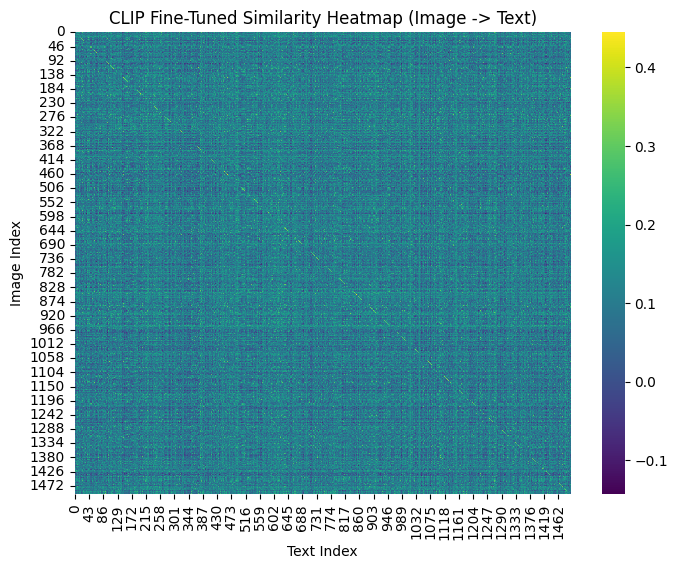

In [ ]:
#  Similarity Heatmap (Image -> Text)

plt.figure(figsize=(8, 6))
sns.heatmap(sims_i2t_clip_finetuned, cmap="viridis")
plt.title("CLIP Fine-Tuned Similarity Heatmap (Image -> Text)")
plt.xlabel("Text Index")
plt.ylabel("Image Index")
plt.show()

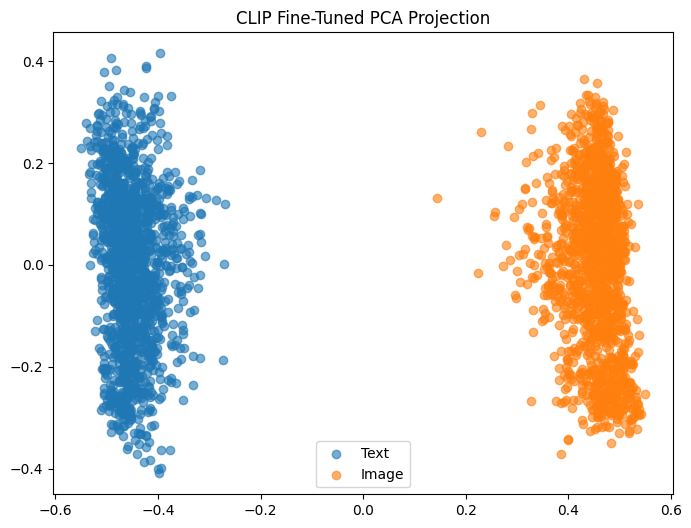

In [ ]:
# Fine-Tuned PCA Projection

plot_pca(img_embeds_clip_finetuned, txt_embeds_clip_finetuned, "CLIP Fine-Tuned PCA Projection")


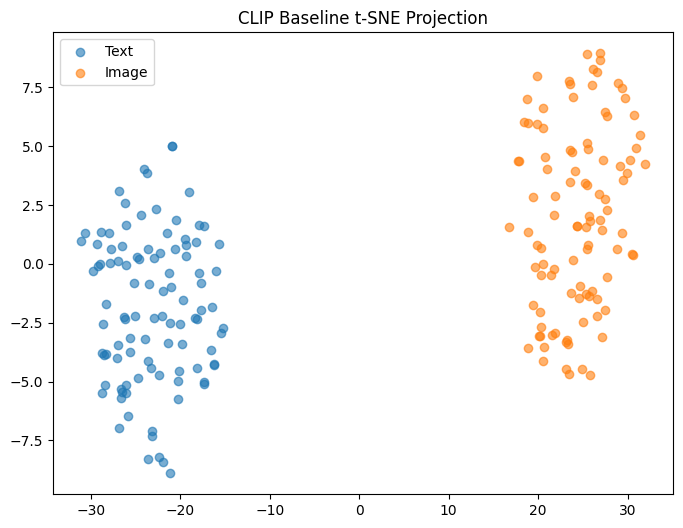

In [ ]:
# t-SNE Projection

plot_tsne(img_embeds_clip_finetuned, txt_embeds_clip_finetuned, "CLIP Baseline t-SNE Projection")

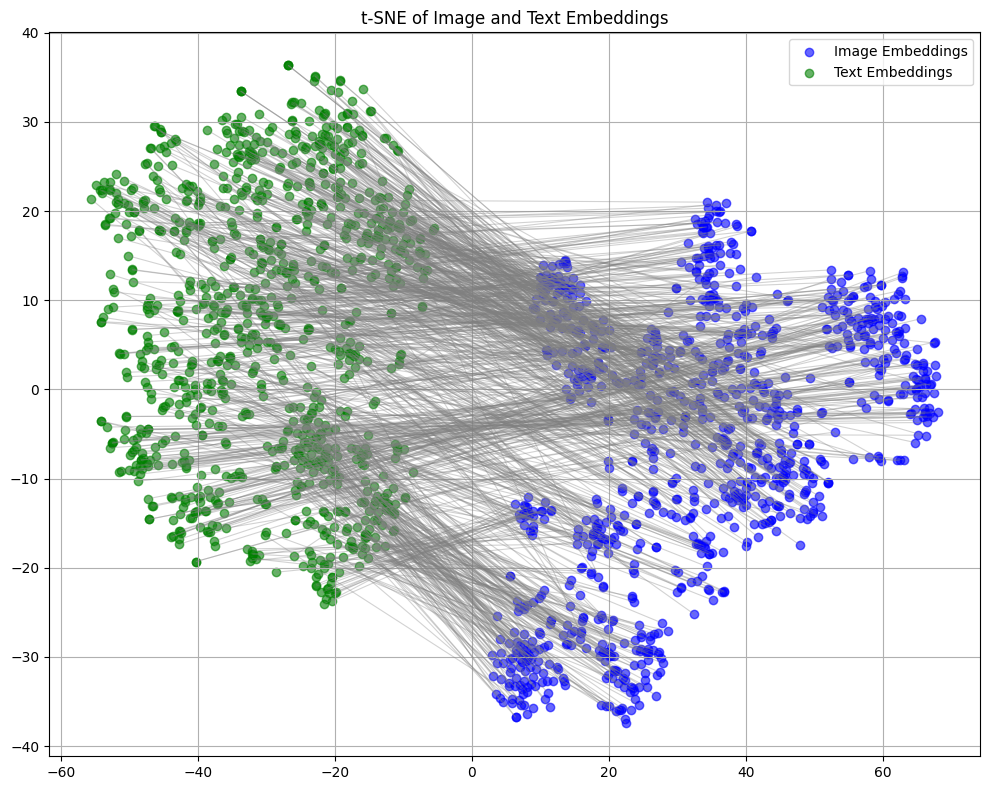

In [ ]:
# call with your variables
tsne_plot(img_embeds_clip_finetuned, txt_embeds_clip_finetuned, num_points=1000)

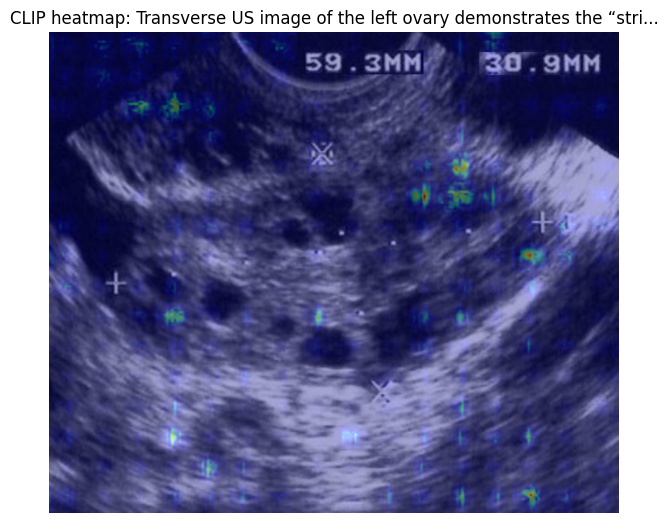

In [ ]:
# pick a sample from the ROCO split
idx = 10
pil_img = test_1000[idx]["image"].convert("RGB")
caption = test_1000[idx]["caption"]

heat = clip_text_image_heatmap(
    pil_img, caption,
    clip_model_finetuned, clip_preprocess,
    device=device,
    noise_samples=0,
    noise_std=0.05
)

show_heatmap_on_image(pil_img, heat, alpha=0.35, title=f"CLIP heatmap: {caption[:60]}...")

In [ ]:
# Save retrieval examples
import pickle

metrics_file_ft = f"clip_finetuned_metrics_{len(test_1000)}.pkl"
with open(metrics_file_ft, "wb") as f:
    pickle.dump(metrics_clip_finetuned, f)
print(f" Saved fine-tuned metrics to {metrics_file_ft}")

 Saved fine-tuned metrics to clip_finetuned_metrics_1500.pkl


# Compare CLIP

In [ ]:
# Recall@K Plot
def plot_recall_comparison(metrics_base, metrics_ft, direction="T2I"):
    plt.figure(figsize=(7,5))
    base_recalls = [metrics_base[direction][f"Recall@{k}"] for k in recall_k_values]
    ft_recalls   = [metrics_ft[direction][f"Recall@{k}"] for k in recall_k_values]

    plt.plot(recall_k_values, base_recalls, marker="o", label="Baseline")
    plt.plot(recall_k_values, ft_recalls, marker="s", label="Fine-tuned")
    plt.title(f"CLIP Recall@K — {direction}")
    plt.xlabel("K")
    plt.ylabel("Recall")
    plt.ylim(0, 1)
    plt.grid(True)
    plt.legend()
    plt.show()

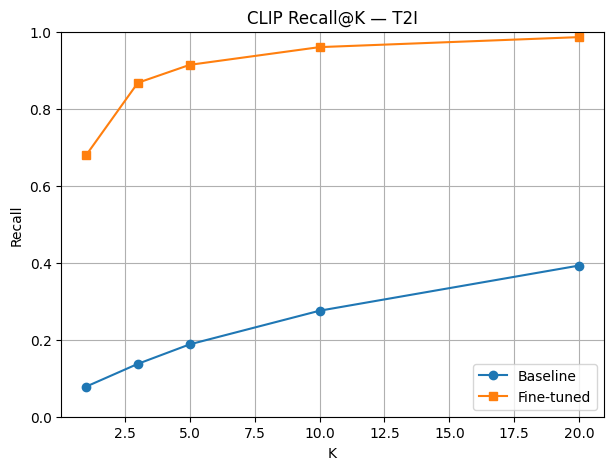

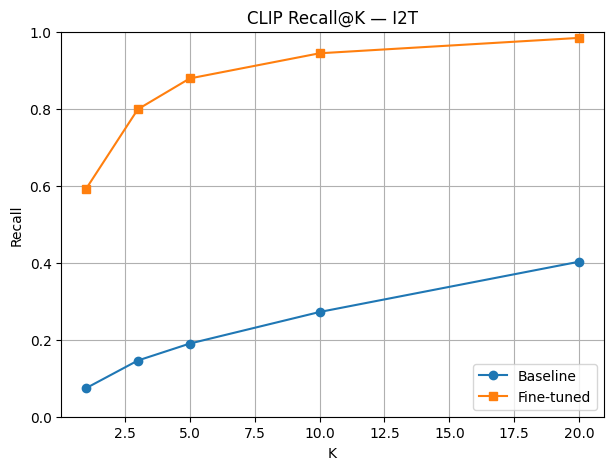

In [ ]:
# Plot for both directions

plot_recall_comparison(metrics_clip_baseline, metrics_clip_finetuned, direction="T2I")
plot_recall_comparison(metrics_clip_baseline, metrics_clip_finetuned, direction="I2T")

# Load DeepSeek

In [ ]:
pwd

'/content/deepseek-vl2-tiny/DeepSeek-VL2'

In [ ]:
import torch
from transformers import AutoModelForCausalLM

from deepseek_vl2.models import DeepseekVLV2Processor, DeepseekVLV2ForCausalLM
from deepseek_vl2.utils.io import load_pil_images

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

Python version is above 3.10, patching the collections module.


In [ ]:
# specify the path to the model

model_path = "deepseek-ai/deepseek-vl2-tiny"
vl_chat_processor: DeepseekVLV2Processor = DeepseekVLV2Processor.from_pretrained(model_path)
tokenizer = vl_chat_processor.tokenizer

/usr/local/lib/python3.11/dist-packages/huggingface_hub/file_download.py:945: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


tokenizer_config.json: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/801 [00:00<?, ?B/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


processor_config.json: 0.00B [00:00, ?B/s]

Add pad token = ['<｜▁pad▁｜>'] to the tokenizer
<｜▁pad▁｜>:2
Add image token = ['<image>'] to the tokenizer
<image>:128815
Add grounding-related tokens = ['<|ref|>', '<|/ref|>', '<|det|>', '<|/det|>', '<|grounding|>'] to the tokenizer with input_ids
<|ref|>:128816
<|/ref|>:128817
<|det|>:128818
<|/det|>:128819
<|grounding|>:128820
Add chat tokens = ['<|User|>', '<|Assistant|>'] to the tokenizer with input_ids
<|User|>:128821
<|Assistant|>:128822



In [ ]:
# Load the pretrained model

vl_gpt = AutoModelForCausalLM.from_pretrained(
    model_path, trust_remote_code=True, torch_dtype=torch.bfloat16
).cuda().eval()

config.json: 0.00B [00:00, ?B/s]

model.safetensors.index.json: 0.00B [00:00, ?B/s]

model-00001-of-000001.safetensors:   0%|          | 0.00/6.74G [00:00<?, ?B/s]

In [ ]:
# Confirm that dataset is still intact

test_1000

Dataset({
    features: ['image', 'image_id', 'caption', 'cui'],
    num_rows: 1500
})

## Fetch Embeddings

In [ ]:
import torch
from torch.nn.functional import normalize
from tqdm import tqdm

def extract_deepseek_embeddings(dataset_split, vl_chat_processor, vl_gpt, device="cuda"):
    image_embeddings = []
    caption_embeddings = []

    for sample in tqdm(dataset_split, desc="Extracting DeepSeek Embeddings"):
        image = sample["image"].convert("RGB")
        caption = sample["caption"]

        # --- IMAGE EMBED ---
        conv_image = [
            {"role": "<|User|>", "content": "<image>\n"},
            {"role": "<|Assistant|>", "content": caption}
        ]
        proc_image = vl_chat_processor(
            conversations=conv_image,
            images=[image],
            force_batchify=True,
            system_prompt=""
        )
        proc_image = dict(proc_image)
        inp_image = {
            k: (torch.stack(proc_image[k]) if isinstance(proc_image[k], list) else proc_image[k])
            for k in ["input_ids", "attention_mask", "images"]
        }
        inp_image["images_seq_mask"] = torch.tensor([[1]], dtype=torch.bool, device=vl_gpt.device)
        inp_image["images_spatial_crop"] = torch.zeros((1, 1, 4), dtype=torch.float16, device=vl_gpt.device)
        for k in inp_image:
            dtype = torch.long if k == "input_ids" else torch.float16
            inp_image[k] = inp_image[k].to(dtype=dtype, device=vl_gpt.device)

        with torch.no_grad():
            emb_img = vl_gpt.prepare_inputs_embeds(**inp_image)
            # cast to fp32 before normalize / saving
            feat_img = emb_img.mean(dim=1).to(torch.float32)
            image_embeddings.append(normalize(feat_img).cpu())

        # --- TEXT EMBED ---
        conv_text = [
            {"role": "<|User|>", "content": },
            {"role": "<|Assistant|>", "content": ""}
        ]
        proc_text = vl_chat_processor(
            conversations=conv_text,
            images=[image],
            force_batchify=True,
            system_prompt=""
        )
        proc_text = dict(proc_text)
        inp_text = {
            k: (torch.stack(proc_text[k]) if isinstance(proc_text[k], list) else proc_text[k])
            for k in ["input_ids", "attention_mask", "images"]
        }
        inp_text["images_seq_mask"] = torch.tensor([[0]], dtype=torch.bool, device=vl_gpt.device)
        inp_text["images_spatial_crop"] = torch.zeros((1, 1, 4), dtype=torch.float16, device=vl_gpt.device)
        for k in inp_text:
            dtype = torch.long if k == "input_ids" else torch.float16
            inp_text[k] = inp_text[k].to(dtype=dtype, device=vl_gpt.device)

        with torch.no_grad():
            emb_txt = vl_gpt.prepare_inputs_embeds(**inp_text)
            feat_txt = emb_txt.mean(dim=1).to(torch.float32)
            caption_embeddings.append(normalize(feat_txt).cpu())

    # lists contain CPU fp32 tensors
    return (
        torch.vstack(image_embeddings).numpy(),
        torch.vstack(caption_embeddings).numpy()
    )

In [ ]:
# Running embedding extraction on the same test set as CLIP

img_embeds_deepseek, txt_embeds_deepseek = extract_deepseek_embeddings(
    test_1000,
    vl_chat_processor,
    vl_gpt
)

Extracting DeepSeek Embeddings: 100%|██████████| 1500/1500 [01:13<00:00, 20.45it/s]


# DeepSeek Evaluation

In [ ]:
# Check shapes to confirm

print("Image embeddings shape:", img_embeds_deepseek.shape)
print("Text embeddings shape:", txt_embeds_deepseek.shape)

Image embeddings shape: (1500, 1280)
Text embeddings shape: (1500, 1280)


In [ ]:
sims_t2i_deepseek = np.dot(txt_embeds_deepseek, img_embeds_deepseek.T)
sims_i2t_deepseek = np.dot(img_embeds_deepseek, txt_embeds_deepseek.T)

In [ ]:
# Metrics
metrics_deepseek = {"T2I": {}, "I2T": {}}

for k in recall_k_values:
    metrics_deepseek["T2I"][f"Recall@{k}"] = compute_recall_at_k(sims_t2i_deepseek, k)
    metrics_deepseek["I2T"][f"Recall@{k}"] = compute_recall_at_k(sims_i2t_deepseek, k)

metrics_deepseek["T2I"]["MRR"] = compute_mrr(sims_t2i_deepseek)
metrics_deepseek["I2T"]["MRR"] = compute_mrr(sims_i2t_deepseek)
metrics_deepseek["T2I"]["Mean Rank"] = compute_mean_rank(sims_t2i_deepseek)
metrics_deepseek["I2T"]["Mean Rank"] = compute_mean_rank(sims_i2t_deepseek)

In [ ]:
# Print results
print("\n DeepSeek Baseline Results (Text -> Image):")
for k, v in metrics_deepseek["T2I"].items():
    print(f"{k:<12}: {v:.4f}")

print("\n DeepSeek Baseline Results (Image -> Text):")
for k, v in metrics_deepseek["I2T"].items():
    print(f"{k:<12}: {v:.4f}")


 DeepSeek Baseline Results (Text -> Image):
Recall@1    : 0.0153
Recall@3    : 0.0327
Recall@5    : 0.0393
Recall@10   : 0.0527
Recall@20   : 0.0693
MRR         : 0.0330
Mean Rank   : 403.8020

 DeepSeek Baseline Results (Image -> Text):
Recall@1    : 0.8440
Recall@3    : 0.8973
Recall@5    : 0.9093
Recall@10   : 0.9253
Recall@20   : 0.9373
MRR         : 0.8749
Mean Rank   : 11.9780


# DeepSeek Visualization

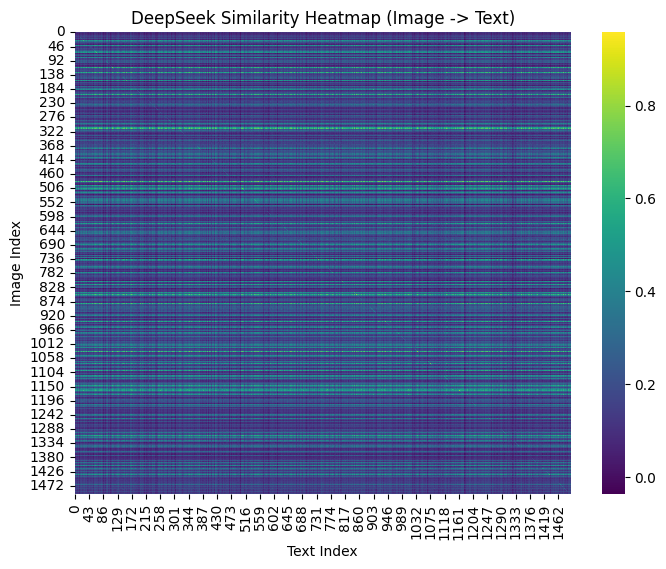

In [ ]:
#  Similarity Heatmap (Image -> Text)

plt.figure(figsize=(8, 6))
sns.heatmap(sims_i2t_deepseek, cmap="viridis")
plt.title("DeepSeek Similarity Heatmap (Image -> Text)")
plt.xlabel("Text Index")
plt.ylabel("Image Index")
plt.show()

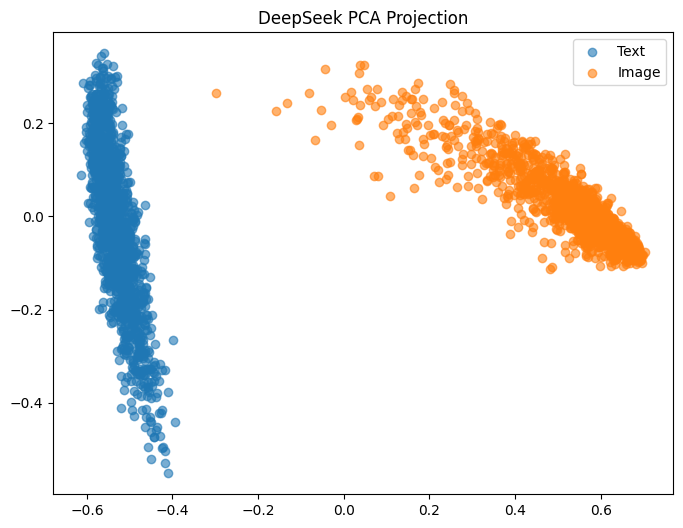

In [ ]:
plot_pca(img_embeds_deepseek, txt_embeds_deepseek, "DeepSeek PCA Projection")

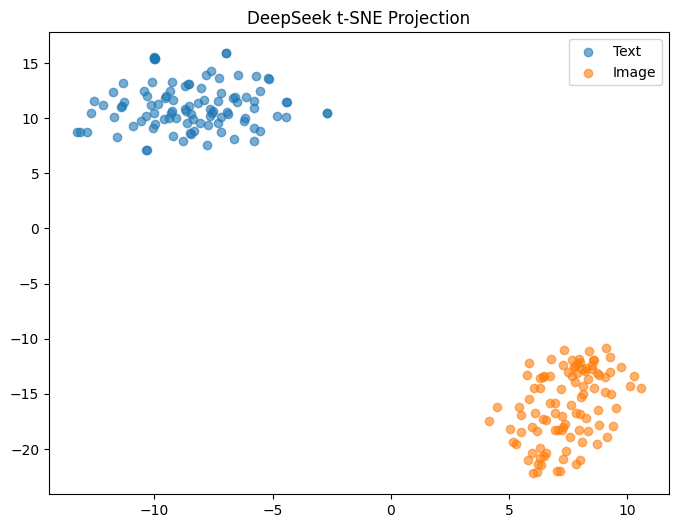

In [ ]:
plot_tsne(img_embeds_deepseek, txt_embeds_deepseek, "DeepSeek t-SNE Projection")

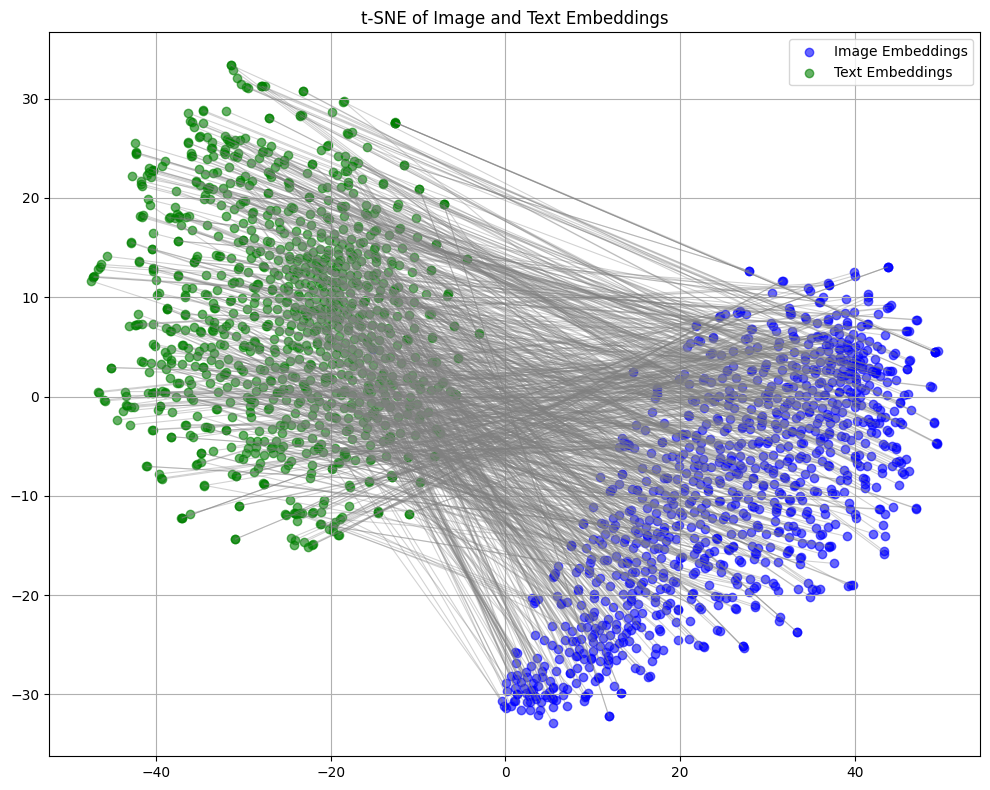

In [ ]:
# call with your variables

tsne_plot(img_embeds_deepseek, txt_embeds_deepseek, num_points=1000)

# DeepSeek Attention Heatmap

In [ ]:
import numpy as np, torch, matplotlib.pyplot as plt
from torch.nn.functional import normalize
from PIL import Image, ImageFilter
import matplotlib

def _model_device(m):  # robust way to get device
    return next(m.parameters()).device

def _occlude(pil_img, box, mode="blur", blur_radius=16, value=0.5):
    x0, y0, x1, y1 = map(int, box)
    occluded = pil_img.copy()
    if mode == "mask":
        g = int(value * 255)
        patch = Image.new("RGB", (x1-x0, y1-y0), color=(g, g, g))
        occluded.paste(patch, (x0, y0, x1, y1))
    else:
        patch = occluded.crop((x0, y0, x1, y1)).filter(ImageFilter.GaussianBlur(radius=blur_radius))
        occluded.paste(patch, (x0, y0, x1, y1))
    return occluded

def _normalize_for_display(h):
    nz = h[h > 0]
    if nz.size == 0: return h
    p1, p99 = np.percentile(nz, [5, 99])
    if p99 <= p1: p1, p99 = nz.min(), nz.max()
    h = np.clip((h - p1) / max(1e-8, (p99 - p1)), 0, 1)
    return h ** 0.7

@torch.no_grad()
def _deepseek_embed_conv(pil_img, caption, vl_chat_processor, vl_gpt, role="image"):
    if role == "image":
        conv = [{"role":"<|User|>","content":"<image>\n"},
                {"role":"<|Assistant|>","content":caption}]
        images = [pil_img]
    else:
        conv = [{"role":"<|User|>","content":caption},
                {"role":"<|Assistant|>","content":""}]
        images = [pil_img]  # harmless for processor

    proc = vl_chat_processor(conversations=conv, images=images, force_batchify=True, system_prompt="")
    proc = dict(proc)
    dev = _model_device(vl_gpt)
    inp = {k: (torch.stack(proc[k]) if isinstance(proc[k], list) else proc[k]) for k in ["input_ids","attention_mask","images"]}
    inp["images_seq_mask"] = torch.tensor([[1]], dtype=torch.bool, device=dev)
    inp["images_spatial_crop"] = torch.zeros((1,1,4), dtype=torch.float16, device=dev)
    for k in inp:
        dtype = torch.long if k == "input_ids" else torch.float16
        inp[k] = inp[k].to(dtype=dtype, device=dev)

    # Try to get last hidden states; fallback to prepare_inputs_embeds
    try:
        out = vl_gpt(**inp, output_hidden_states=True, use_cache=False, return_dict=True)
        hs = out.hidden_states if hasattr(out, "hidden_states") else None
        if hs is None and isinstance(out, tuple) and len(out) >= 3:
            hs = out[2]
        if hs is not None:
            feat = hs[-1].mean(dim=1).to(torch.float32)   # [1, D]
        else:
            raise RuntimeError("No hidden_states in output.")
    except Exception:
        emb = vl_gpt.prepare_inputs_embeds(**inp)         # [1, T, D]
        feat = emb.mean(dim=1).to(torch.float32)          # [1, D]
    return normalize(feat).cpu().squeeze(0)               # [D]

def deepseek_text_image_heatmap(
    pil_img, caption, vl_chat_processor, vl_gpt,
    grid_size=14, occlude_mode="blur", occlude_value=0.5, blur_radius=16,
    noise_samples=0, noise_std=0.05, show=True, figsize=(6,6), debug=True
):
    pil_img = pil_img.convert("RGB"); W, H = pil_img.size
    txt = _deepseek_embed_conv(pil_img, caption, vl_chat_processor, vl_gpt, role="text")
    img_ref = _deepseek_embed_conv(pil_img, caption, vl_chat_processor, vl_gpt, role="image")
    baseline = float((img_ref * txt).sum().item())

    heat = np.zeros((grid_size, grid_size), dtype=np.float32)
    cw, ch = W / grid_size, H / grid_size

    for gy in range(grid_size):
        for gx in range(grid_size):
            x0, y0 = int(round(gx*cw)), int(round(gy*ch))
            x1, y1 = int(round((gx+1)*cw)), int(round((gy+1)*ch))

            sims = []
            runs = max(1, int(noise_samples))
            for _ in range(runs):
                occluded = _occlude(pil_img, (x0,y0,x1,y1), mode=occlude_mode, blur_radius=blur_radius, value=occlude_value)
                if noise_samples > 0 and noise_std > 0:
                    arr = np.array(occluded).astype(np.float32)/255.0
                    arr = np.clip(arr + np.random.normal(0, noise_std, arr.shape).astype(np.float32), 0, 1)
                    occluded = Image.fromarray((arr*255).astype(np.uint8))
                img_occ = _deepseek_embed_conv(occluded, caption, vl_chat_processor, vl_gpt, role="image")
                sims.append(float((img_occ * txt).sum().item()))

            impact = baseline - (sum(sims)/len(sims))
            heat[gy, gx] = max(0.0, impact)

    if debug:
        print({
            "matplotlib_backend": matplotlib.get_backend(),
            "baseline": round(baseline, 4),
            "heat_max_drop": round(float(heat.max()), 6),
            "nonzero_cells": int((heat > 0).sum())
        })

    # Prepare display heatmap
    heat_disp = _normalize_for_display(heat)
    hm = Image.fromarray((heat_disp * 255).astype(np.uint8)).resize((W, H), Image.BILINEAR)
    heat_up = np.array(hm).astype(np.float32) / 255.0

    if show:
        plt.figure(figsize=figsize)
        plt.imshow(pil_img)
        plt.imshow(heat_up, alpha=0.45, cmap="jet", vmin=0.0, vmax=1.0)
        plt.title("DeepSeek-VL2 text↔image relevance")
        plt.axis("off")
        plt.show()

    return heat_up  # <--- always returns

{'matplotlib_backend': 'module://matplotlib_inline.backend_inline', 'baseline': -0.0145, 'heat_max_drop': 0.0, 'nonzero_cells': 0}


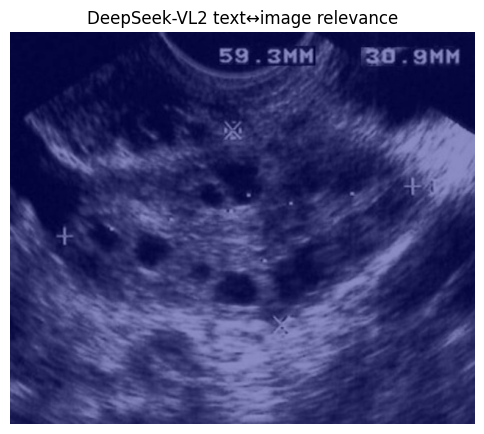

<class 'numpy.ndarray'> (534, 633) 0.0 0.0


In [ ]:
idx = 10
pil_img = test_1000[idx]["image"].convert("RGB")
caption = test_1000[idx]["caption"]

heat = deepseek_text_image_heatmap(
    pil_img, caption, vl_chat_processor, vl_gpt,
    grid_size=12, occlude_mode="blur", blur_radius=18,
    noise_samples=0, show=True, debug=True
)
print(type(heat), heat.shape, float(heat.min()), float(heat.max()))

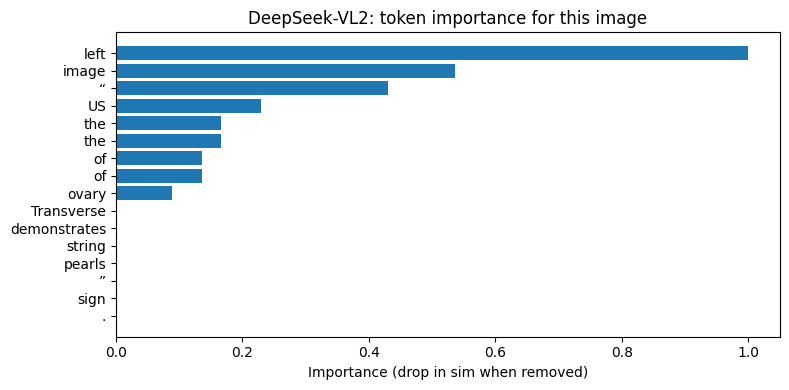

In [ ]:
import re
import numpy as np
import torch
from torch.nn.functional import normalize
import matplotlib.pyplot as plt

# --- reuse your DeepSeek helpers from before ---
@torch.no_grad()
def _deepseek_embed_image(pil_img, caption, vl_chat_processor, vl_gpt):
    conv = [
        {"role": "<|User|>", "content": "<image>\n"},
        {"role": "<|Assistant|>", "content": caption}
    ]
    proc = vl_chat_processor(conversations=conv, images=[pil_img], force_batchify=True, system_prompt="")
    proc = dict(proc)
    inp = {
        k: (torch.stack(proc[k]) if isinstance(proc[k], list) else proc[k])
        for k in ["input_ids", "attention_mask", "images"]
    }
    inp["images_seq_mask"] = torch.tensor([[1]], dtype=torch.bool, device=vl_gpt.device)
    inp["images_spatial_crop"] = torch.zeros((1, 1, 4), dtype=torch.float16, device=vl_gpt.device)
    for k in inp:
        dtype = torch.long if k == "input_ids" else torch.float16
        inp[k] = inp[k].to(dtype=dtype, device=vl_gpt.device)

    emb = vl_gpt.prepare_inputs_embeds(**inp)
    feat = emb.mean(dim=1).to(torch.float32)
    return normalize(feat).cpu().squeeze(0)

@torch.no_grad()
def _deepseek_embed_text(caption, pil_img, vl_chat_processor, vl_gpt):
    conv = [
        {"role": "<|User|>", "content": caption},
        {"role": "<|Assistant|>", "content": ""}
    ]
    proc = vl_chat_processor(conversations=conv, images=[pil_img], force_batchify=True, system_prompt="")
    proc = dict(proc)
    inp = {
        k: (torch.stack(proc[k]) if isinstance(proc[k], list) else proc[k])
        for k in ["input_ids", "attention_mask", "images"]
    }
    inp["images_seq_mask"] = torch.tensor([[1]], dtype=torch.bool, device=vl_gpt.device)
    inp["images_spatial_crop"] = torch.zeros((1, 1, 4), dtype=torch.float16, device=vl_gpt.device)
    for k in inp:
        dtype = torch.long if k == "input_ids" else torch.float16
        inp[k] = inp[k].to(dtype=dtype, device=vl_gpt.device)

    emb = vl_gpt.prepare_inputs_embeds(**inp)
    feat = emb.mean(dim=1).to(torch.float32)
    return normalize(feat).cpu().squeeze(0)

# --- simple tokenizer (word + punctuation) ---
_WORD_RE = re.compile(r"\w+|[^\w\s]", re.UNICODE)

def _split_words(caption: str):
    return _WORD_RE.findall(caption)

def _join_words(tokens):
    # coarse join; punctuation may have extra spaces but it's fine for importance
    out = []
    for i, t in enumerate(tokens):
        if i > 0 and re.match(r"\w", t) and re.match(r"\w", tokens[i-1]):
            out.append(" ")
        elif i > 0 and re.match(r"\w", t) and not re.match(r"\w", tokens[i-1]):
            out.append(" ")
        out.append(t)
    return "".join(out)

# --- main: token importance given an image ---
def deepseek_image_to_text_heatmap(
    pil_img, caption,
    vl_chat_processor, vl_gpt,
    device="cuda",
    show=True,
    top_k=None,          # show only top-k tokens in the bar plot
    figsize=(8, 4)
):

    pil_img = pil_img.convert("RGB")

    # baseline embeddings
    img_embed = _deepseek_embed_image(pil_img, caption, vl_chat_processor, vl_gpt)  # fixed
    txt_full  = _deepseek_embed_text(caption, pil_img, vl_chat_processor, vl_gpt)
    baseline = float((img_embed * txt_full).sum().item())

    tokens = _split_words(caption)
    impacts = np.zeros(len(tokens), dtype=np.float32)

    for i in range(len(tokens)):
        # drop token i
        modified = _join_words(tokens[:i] + tokens[i+1:])
        txt_mod = _deepseek_embed_text(modified, pil_img, vl_chat_processor, vl_gpt)
        sim = float((img_embed * txt_mod).sum().item())
        impacts[i] = max(0.0, baseline - sim)

    # normalize to [0,1]
    if impacts.max() > 0:
        scores = impacts / (impacts.max() + 1e-8)
    else:
        scores = impacts

    if show:
        # sort by importance for plotting
        idxs = np.argsort(-scores)
        if top_k is not None:
            idxs = idxs[:top_k]
        toks_plot = [tokens[i] for i in idxs]
        vals_plot = [scores[i] for i in idxs]

        plt.figure(figsize=figsize)
        y = np.arange(len(toks_plot))
        plt.barh(y, vals_plot)
        plt.yticks(y, toks_plot)
        plt.gca().invert_yaxis()
        plt.xlabel("Importance (drop in sim when removed)")
        plt.title("DeepSeek-VL2: token importance for this image")
        plt.tight_layout()
        plt.show()

    return tokens, scores

# ---------- usage ----------
idx = 10
pil_img = test_1000[idx]["image"].convert("RGB")
caption = test_1000[idx]["caption"]

tokens, token_scores = deepseek_image_to_text_heatmap(
    pil_img, caption,
    vl_chat_processor, vl_gpt,
    show=True,
    top_k=20
)

In [ ]:
# Save metrics for benchmarking

metrics_file_deepseek = f"deepseek_baseline_metrics_{len(test_1000)}.pkl"
with open(metrics_file_deepseek, "wb") as f:
    pickle.dump(metrics_deepseek, f)
print(f" Saved DeepSeek baseline metrics to {metrics_file_deepseek}")

 Saved DeepSeek baseline metrics to deepseek_baseline_metrics_1500.pkl


In [ ]:
# Save retrieval examples

examples_deepseek = {
    "T2I": get_top_retrieval_examples(test_1000, sims_t2i_deepseek, direction="T2I", top_k=5),
    "I2T": get_top_retrieval_examples(test_1000, sims_i2t_deepseek, direction="I2T", top_k=5)
}

In [ ]:
# Recall@K comparison plot
def plot_model_comparison(metrics_clip, metrics_deepseek, direction="T2I"):

    plt.figure(figsize=(7,5))
    ft_recalls   = [metrics_clip_finetuned[direction][f"Recall@{k}"] for k in recall_k_values]
    deepseek_recalls = [metrics_deepseek[direction][f"Recall@{k}"] for k in recall_k_values]

    plt.plot(recall_k_values, ft_recalls, marker="o", label="CLIP (Tuned)")
    plt.plot(recall_k_values, deepseek_recalls, marker="s", label="DeepSeek")
    plt.title(f"Recall@K — {direction}")
    plt.xlabel("K")
    plt.ylabel("Recall")
    plt.ylim(0, 1)
    plt.grid(True)
    plt.legend()
    plt.show()

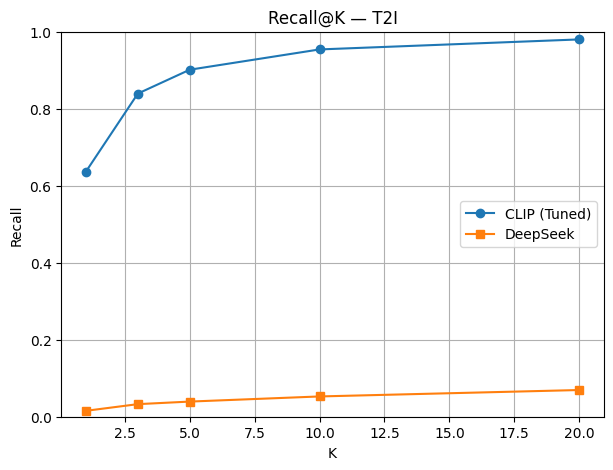

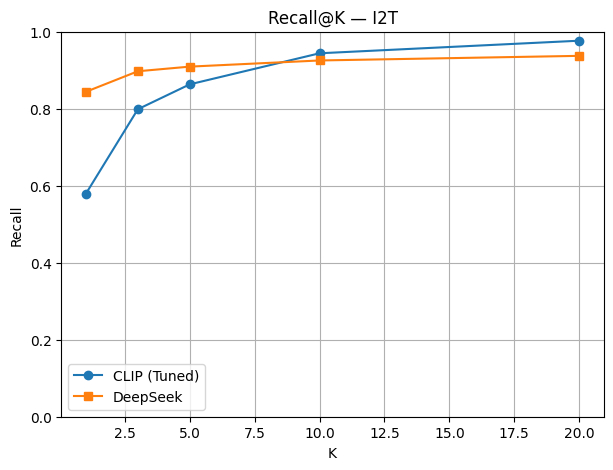

In [ ]:
# Plot for both retrieval directions

plot_model_comparison(metrics_clip_finetuned, metrics_deepseek, direction="T2I")
plot_model_comparison(metrics_clip_finetuned, metrics_deepseek, direction="I2T")

# DeepSeek Fine-Tuning

In [ ]:
from torch.utils.data import DataLoader
from torch.nn.utils.rnn import pad_sequence

def collate_fn_deepseek(batch):

    sample = batch[0]  # batch_size=1 enforced later
    image = sample["image"].convert("RGB")
    caption = sample["caption"]

    conversation = [
        {"role": "<|User|>", "content": "<image>\n"},
        {"role": "<|Assistant|>", "content": ""}
    ]

    processed = vl_chat_processor(
        conversations=conversation,
        images=[image],
        force_batchify=True,
        system_prompt=""
    )
    processed = dict(processed)

    inputs = {}
    for k in processed:
        v = processed[k]
        if isinstance(v, torch.Tensor):
            if k == "input_ids":
                inputs[k] = v.to(dtype=torch.long, device=vl_gpt.device)
            else:
                inputs[k] = v.to(dtype=torch.float16, device=vl_gpt.device)
        else:
            inputs[k] = v

    if isinstance(inputs["images"], list):
        inputs["images"] = torch.stack(inputs["images"])
    inputs["images"] = inputs["images"].to(dtype=torch.float16, device=vl_gpt.device).contiguous()

    # Required dummy fields
    inputs["images_seq_mask"] = torch.tensor([[1]], dtype=torch.bool, device=vl_gpt.device)
    inputs["images_spatial_crop"] = torch.zeros((1, 1, 4), dtype=torch.float16, device=vl_gpt.device)

    return inputs

In [ ]:
from torch.utils.data import DataLoader

train_loader_deepseek = DataLoader(
    test_1000,
    batch_size=1,
    shuffle=True,
    collate_fn=collate_fn_deepseek
)

In [ ]:
import torch.nn.functional as F

def fine_tune_deepseek(train_loader, model, device="cuda", epochs=2, lr=5e-6):

    model.train()
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

    for epoch in range(epochs):
        total_loss = 0.0

        for batch in train_loader:
            optimizer.zero_grad()

            embeds = model.prepare_inputs_embeds(**batch)  # (1, seq_len, dim)
            pooled_embeds = embeds.mean(dim=1)             # (1, dim)
            pooled_embeds = F.normalize(pooled_embeds, p=2, dim=-1)

            # Simple self-similarity loss for batch_size=1
            loss = (1 - torch.mm(pooled_embeds, pooled_embeds.T)).mean()

            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        print(f"Epoch {epoch+1}/{epochs} - Loss: {total_loss/len(train_loader):.4f}")

    model.eval()
    return model

In [ ]:
# Run fine-tuning
vl_gpt_finetuned = fine_tune_deepseek(train_loader_deepseek,
                                      vl_gpt,
                                      device="cuda",
                                      epochs=5,
                                      lr=5e-6
                                      )

Epoch 1/5 - Loss: 0.0005
Epoch 2/5 - Loss: 0.0004
Epoch 3/5 - Loss: 0.0004
Epoch 4/5 - Loss: 0.0004
Epoch 5/5 - Loss: 0.0004


In [ ]:
img_embeds_deepseek_ft, txt_embeds_deepseek_ft = extract_deepseek_embeddings(
    test_1000,
    vl_chat_processor,
    vl_gpt_finetuned
)

Extracting DeepSeek Embeddings: 100%|██████████| 1500/1500 [01:10<00:00, 21.40it/s]


In [ ]:
# Compute similarity matrices

sims_t2i_deepseek_ft = np.dot(txt_embeds_deepseek_ft, img_embeds_deepseek_ft.T)
sims_i2t_deepseek_ft = np.dot(img_embeds_deepseek_ft, txt_embeds_deepseek_ft.T)

In [ ]:
# Calculate metrics
metrics_deepseek_ft = {"T2I": {}, "I2T": {}}

for k in recall_k_values:
    metrics_deepseek_ft["T2I"][f"Recall@{k}"] = compute_recall_at_k(sims_t2i_deepseek_ft, k)
    metrics_deepseek_ft["I2T"][f"Recall@{k}"] = compute_recall_at_k(sims_i2t_deepseek_ft, k)

metrics_deepseek_ft["T2I"]["MRR"] = compute_mrr(sims_t2i_deepseek_ft)
metrics_deepseek_ft["I2T"]["MRR"] = compute_mrr(sims_i2t_deepseek_ft)
metrics_deepseek_ft["T2I"]["Mean Rank"] = compute_mean_rank(sims_t2i_deepseek_ft)
metrics_deepseek_ft["I2T"]["Mean Rank"] = compute_mean_rank(sims_i2t_deepseek_ft)

In [ ]:
# Print metrics

print("\n DeepSeek Fine-tuned Results (Text -> Image):")
for k, v in metrics_deepseek_ft["T2I"].items():
    print(f"{k:<12}: {v:.4f}")

print("\n DeepSeek Fine-tuned Results (Image -> Text):")
for k, v in metrics_deepseek_ft["I2T"].items():
    print(f"{k:<12}: {v:.4f}")


 DeepSeek Fine-tuned Results (Text -> Image):
Recall@1    : 0.0153
Recall@3    : 0.0327
Recall@5    : 0.0393
Recall@10   : 0.0527
Recall@20   : 0.0693
MRR         : 0.0330
Mean Rank   : 403.5700

 DeepSeek Fine-tuned Results (Image -> Text):
Recall@1    : 0.8420
Recall@3    : 0.8973
Recall@5    : 0.9093
Recall@10   : 0.9240
Recall@20   : 0.9373
MRR         : 0.8737
Mean Rank   : 12.0993


# Side-by-side Viewer

In [ ]:
# Save top retrieval examples
def get_top_retrieval_examples(dataset_split, sims, direction="T2I", top_k=5):

    examples = []
    for i in range(len(dataset_split)):
        sorted_idx = np.argsort(-sims[i])[:top_k]

        if direction == "T2I":
            examples.append({
                "query_text": dataset_split[int(i)]["caption"],
                "retrieved_images": [dataset_split[int(j)]["image"] for j in sorted_idx]
            })
        else:  # I2T
            examples.append({
                "query_image": dataset_split[int(i)]["image"],
                "retrieved_texts": [dataset_split[int(j)]["caption"] for j in sorted_idx]
            })

    return examples # python ints

In [ ]:
import numpy as np
import pandas as pd

def compare_retrievals_side_by_side(
    dataset_split,
    model_a_type, mode_a, img_embeds_a, txt_embeds_a,
    model_b_type, mode_b, img_embeds_b, txt_embeds_b,
    retrieval_fn,
    top_k=1,
    show_top_k=False,
    pretty_print=False,
    max_examples=10  # Change the number of displayed samples
):


    # build consistent model labels
    model_a_name = f"{model_a_type}_{mode_a}"
    model_b_name = f"{model_b_type}_{mode_b}"

    # compute similarity scores
    sim_a = retrieval_fn(img_embeds_a, txt_embeds_a)
    sim_b = retrieval_fn(img_embeds_b, txt_embeds_b)

    records = []
    correct_a_count = 0
    correct_b_count = 0

    for idx, sample in enumerate(dataset_split):
        gt_caption = sample["caption"]

        # --- model A ---
        top_indices_a = np.argsort(-sim_a[idx])[:top_k]
        pred_caption_a = dataset_split[int(top_indices_a[0])]["caption"]
        correct_a = pred_caption_a.strip() == gt_caption.strip()
        if correct_a:
            correct_a_count += 1

        # --- model B ---
        top_indices_b = np.argsort(-sim_b[idx])[:top_k]
        pred_caption_b = dataset_split[int(top_indices_b[0])]["caption"]
        correct_b = pred_caption_b.strip() == gt_caption.strip()
        if correct_b:
            correct_b_count += 1

        row = {
            "index": idx,
            "ground_truth": gt_caption,
            f"{model_a_name}_prediction": pred_caption_a,
            f"{model_a_name}_correct": "Correct" if correct_a else "Wrong",
            f"{model_b_name}_prediction": pred_caption_b,
            f"{model_b_name}_correct": "Correct" if correct_b else "Wrong"
        }

        # optional top-k display
        if show_top_k and top_k > 1:
            row[f"{model_a_name}_top_{top_k}"] = [
                (dataset_split[int(i)]["caption"], float(sim_a[idx, i]))
                for i in top_indices_a
            ]
            row[f"{model_b_name}_top_{top_k}"] = [
                (dataset_split[int(i)]["caption"], float(sim_b[idx, i]))
                for i in top_indices_b
            ]

            if pretty_print and idx < max_examples:
                print(f"\n[Sample {idx}]")
                print(f" ground truth: {gt_caption}")
                print(f" {model_a_name} top-{top_k}:")
                for rank, i in enumerate(top_indices_a, start=1):
                    print(f"   {rank}. {dataset_split[int(i)]['caption']}  (score={sim_a[idx, i]:.4f})")
                print(f" {model_b_name} top-{top_k}:")
                for rank, i in enumerate(top_indices_b, start=1):
                    print(f"   {rank}. {dataset_split[int(i)]['caption']}  (score={sim_b[idx, i]:.4f})")

        records.append(row)

    # dataframe
    df = pd.DataFrame(records)

    # accuracy summary
    total = len(dataset_split)
    acc_a = correct_a_count / total * 100
    acc_b = correct_b_count / total * 100
    print("\n=== retrieval accuracy summary ===")
    print(f"{model_a_name}: {correct_a_count}/{total} ({acc_a:.2f}%)")
    print(f"{model_b_name}: {correct_b_count}/{total} ({acc_b:.2f}%)\n")

    return df

# Show Tuned Retrievals

**Clip**



 Query Text: CT chest axial view showing a huge ascending aortic aneurysm (*).


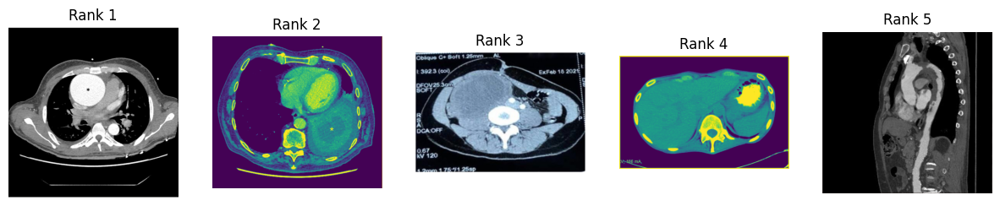


 Query Text: Computed tomography (CT) shows floating thrombosis (white arrow)


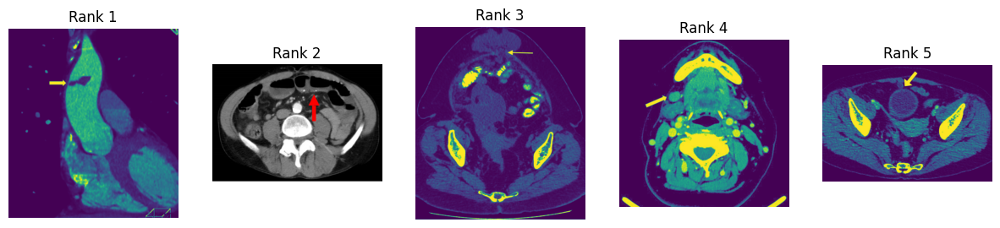


 Query Text: Digitally subtracted angiogram demonstrates active extravasation of the superior rectal artery into the ileal-conduit (blue arrow)


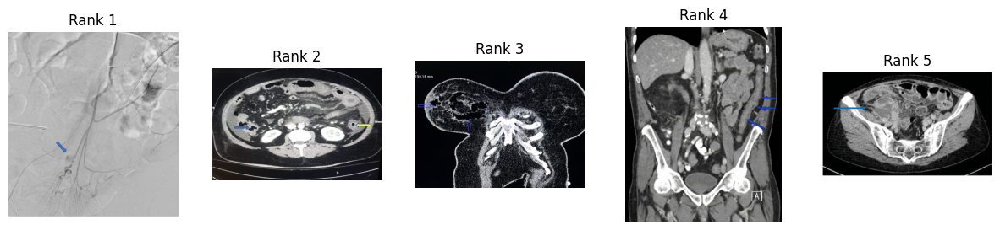


 Query Text: Digitally subtracted angiogram of the IMA demonstrated cessation of flow through the proximal superior rectal artery in the region of the intersection between the artery and ureter with retained perfusion of the rectosigmoid region and resolution of active extravasation


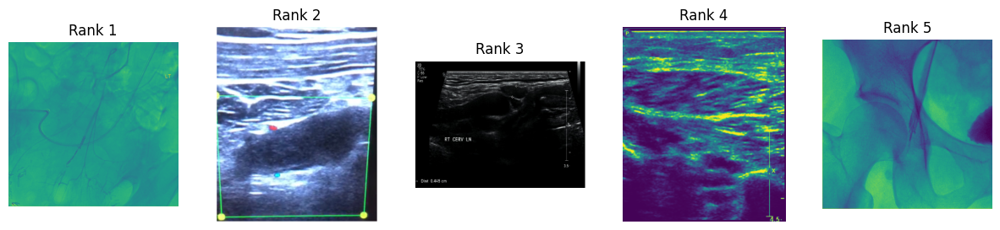


 Query Text: Angle measurement of a Type 1 canal.


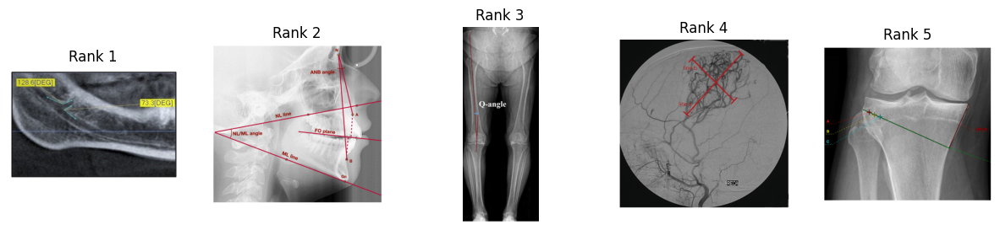

In [ ]:
# Show first 5 Text -> Image retrievals

show_retrieval_examples(examples_clip_ft["T2I"], direction="T2I", num_queries=5)

**DeepSeek**


 Query Text: CT chest axial view showing a huge ascending aortic aneurysm (*).


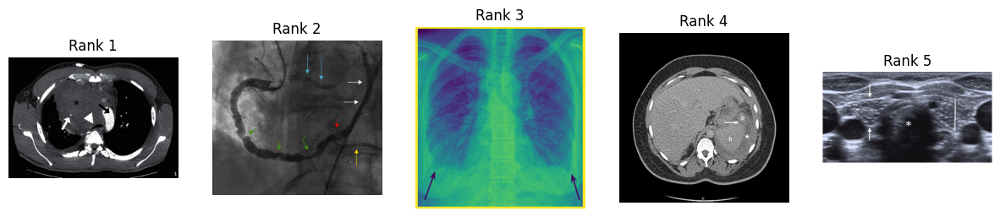


 Query Text: Computed tomography (CT) shows floating thrombosis (white arrow)


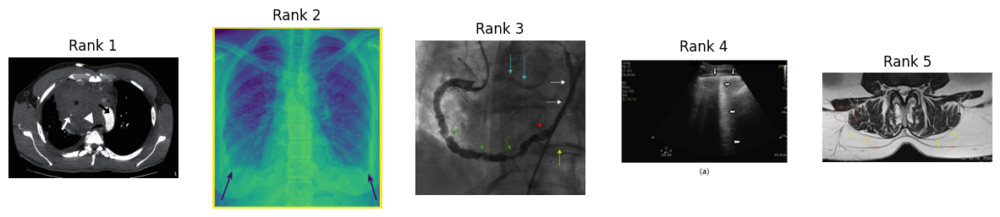


 Query Text: Digitally subtracted angiogram demonstrates active extravasation of the superior rectal artery into the ileal-conduit (blue arrow)


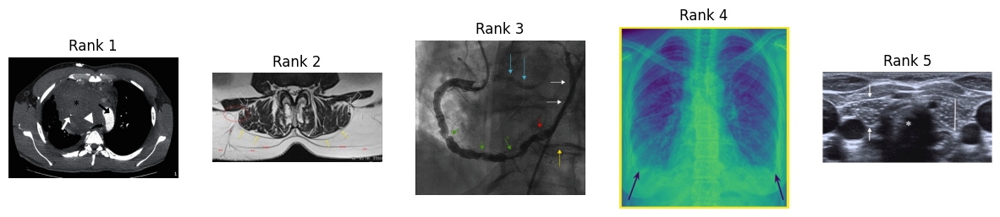


 Query Text: Digitally subtracted angiogram of the IMA demonstrated cessation of flow through the proximal superior rectal artery in the region of the intersection between the artery and ureter with retained perfusion of the rectosigmoid region and resolution of active extravasation


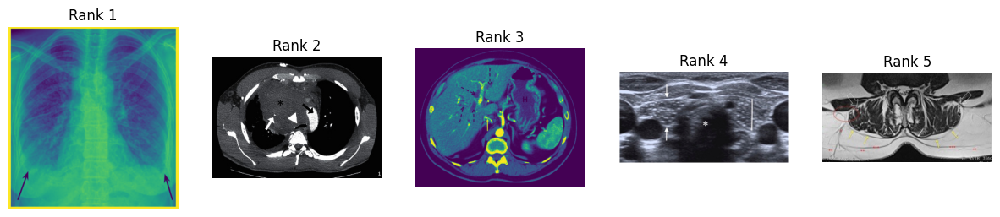


 Query Text: Angle measurement of a Type 1 canal.


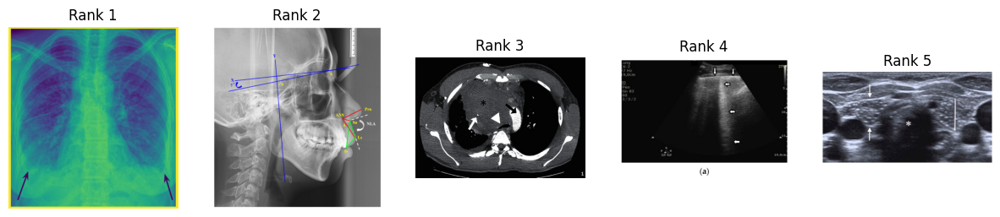

In [ ]:
# Show first 5 Text -> Image retrievals (DeepSeek)

show_retrieval_examples(examples_deepseek["T2I"], direction="T2I", num_queries=5)

# Retreival Examples (I2T)



*   CLIP Model



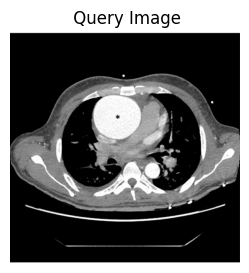

Top retrieved captions:
1. Chest CT showing mild pericardial effusion, no evidence of inflammation or cardiomyopathy
2. CT chest axial view showing a huge ascending aortic aneurysm (*).
3. Computed tomography angiography showing a collection around the aortic root consistent with a periaortic abscess.
4. Cardiac axial section CT at the level of the aortic valve with an arrow showing peri-valvular abscess
5. Coronal view of CT angiography of the chest showing aneurysmal dilatation of the aortic root approaching 6 cm with extensive DeBakey type 1 dissection


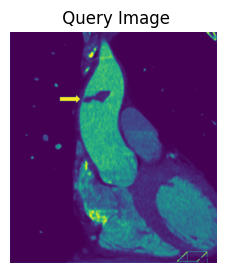

Top retrieved captions:
1. Computed tomography (CT) shows floating thrombosis (white arrow)
2. CT scan revealed the persistence of the air bubble.
3. Pseudoaneurysm was occulted with coils and gel foam cubes (Arrow).
4. The lead bullet identified with ultrasound.
5. Four-chamber view demonstrating clot burden within the right atrium (arrow)


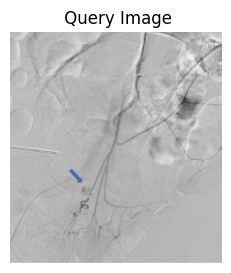

Top retrieved captions:
1. Digitally subtracted angiogram demonstrates active extravasation of the superior rectal artery into the ileal-conduit (blue arrow)
2. Magnetic gel in lung tissue (blue arrow) observed under X-ray.
3. Post-contrast dorsal T1W image showing the contrast enhancement of the lamina of L2 in the middle of the mass (blue arrow).
4. CT angiogram (anteroposterior view) showing right and left-sided popliteal artery occlusion (magnified image with blue arrows).
5. CT pulmonary angiogram showing large pockets of gas within the right breast parenchyma (blue arrows) with edema of the overlying skin. CT: computed tomography


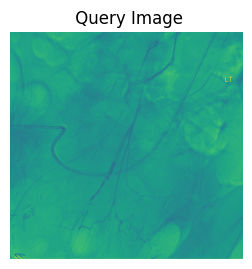

Top retrieved captions:
1. Inferior epigastric artery demonstrating active extravasation on angiography
2. Angiography of the left internal iliac artery by a Bernstein catheter showing a pseudoaneurysm of the gluteal artery (red arrow).
3. Digitally subtracted angiogram of the IMA demonstrated cessation of flow through the proximal superior rectal artery in the region of the intersection between the artery and ureter with retained perfusion of the rectosigmoid region and resolution of active extravasation
4. Fluoroscopic image showing balloon dilation of lumen-apposing metal stent.
5. Trans-Kehr cholangiography.


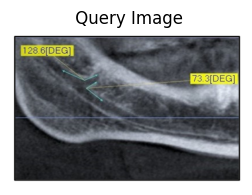

Top retrieved captions:
1. Example of D W vs. slice number for a sample patient. The curve represents the water-equivalent diameter D W computed for each slice.
2. Angle measurement of a Type 1 canal.
3. Measurement of the Q-angle. The angle between the line connecting the center of the patella and the tibial tuberosity, and the line connecting the center of the patella and the anterior superior iliac spine was defined as the Q-angle
4. The measurement of the bisect offset (BO), defined as the portion of the width of the patella lateral to the deepest point of the trochlear groove
5. – Two-dimensional ultrasound image with measurement of popliteal vein diameter after a compression maneuver.


In [ ]:
# Show first 5 Image -> Text retrievals

show_retrieval_examples(examples_clip_ft["I2T"], direction="I2T", num_queries=5)

# Retrieval Examples I2T (DeepSeek)

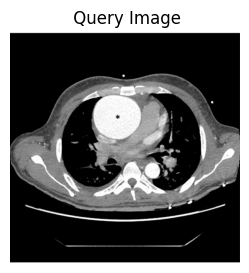

Top retrieved captions:
1. CT chest axial view showing a huge ascending aortic aneurysm (*).
2. Abdominal CT scan The scan shows a small septated cystic lesion in segment 8/1 of the liver (white arrow).
3. Axial chest CT scan showing bilateral hilar adenopathy (asterisks).
4. CT Chest before starting chemotherapy showed bilateral parenchymal metastatic nodules(red arrow)
5. Cranial magnetic resonance imaging (high-resolution black-blood T1-weighted spin-echo sequence, fat-suppressed, contrast-enhanced) in 2017: increased signal at the frontal branches (arrows) and at the parietal branches (arrowheads) of the superficial temporal arteries as a sign of active giant cell arteritis.


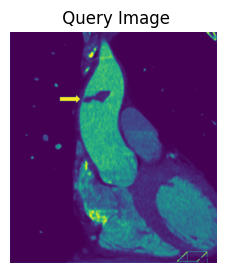

Top retrieved captions:
1. Abdominal CT scan The scan shows a small septated cystic lesion in segment 8/1 of the liver (white arrow).
2. Computed tomography (CT) shows floating thrombosis (white arrow)
3. Cranial magnetic resonance imaging (high-resolution black-blood T1-weighted spin-echo sequence, fat-suppressed, contrast-enhanced) in 2017: increased signal at the frontal branches (arrows) and at the parietal branches (arrowheads) of the superficial temporal arteries as a sign of active giant cell arteritis.
4. Computed tomography (CT) scan of the abdomen showing dilated intestinal loops (white arrow)
5. Coronal computed tomography image demonstrating a homogenous mass (arrow) in the left lung apex with erosion of the underlying vertebra (short arrow).


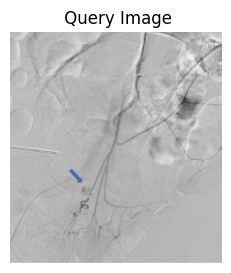

Top retrieved captions:
1.  T1 weighted images one hour after hepatocyte-specific agent injection (gadobenate dimeglumine). Hyposignal of the lesion indicates that this is not a hepatocytic tumor.
2. Cranial magnetic resonance imaging (high-resolution black-blood T1-weighted spin-echo sequence, fat-suppressed, contrast-enhanced) in 2017: increased signal at the frontal branches (arrows) and at the parietal branches (arrowheads) of the superficial temporal arteries as a sign of active giant cell arteritis.
3. Abdominal CT scan The scan shows a small septated cystic lesion in segment 8/1 of the liver (white arrow).
4. CT scan showing reactive small mesenteric lymphadenopathy and circumferential wall thickening of the colon with liquid stool noted in the rectum minimal surrounding fat stranding suggestive of pancolitis.
5. Axial CT scan without contrast enhancement. Red arrows show two spots of unilateral typical deep cortical venous hemorrhages with minor surrounding oedema in the left f

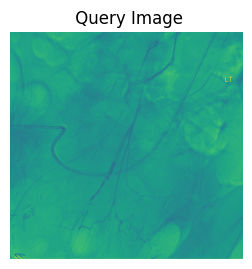

Top retrieved captions:
1. Digitally subtracted angiogram of the IMA demonstrated cessation of flow through the proximal superior rectal artery in the region of the intersection between the artery and ureter with retained perfusion of the rectosigmoid region and resolution of active extravasation
2. Axial CT scan without contrast enhancement. Red arrows show two spots of unilateral typical deep cortical venous hemorrhages with minor surrounding oedema in the left frontal lobe of the brain. The frontal hemorrhage spot crosses the borders of arterial brain vascular territories.
3. Contrast-enhanced T1-weighted coronal image of the brain, 1 month after initial presentation. The arrow shows a diminished enlargement of the gland with a mostly empty sella.
4. CT scan of the chest, abdomen, and pelvis without contrast revealed a large amount of gas within the portal vein in the left lobe of the liver, in the extrahepatic portal vein, and in the wall of the stomach consistent with kayexalate-i

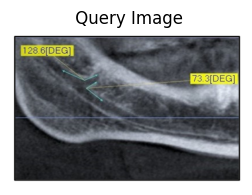

Top retrieved captions:
1. Abdominal CT scan The scan shows a small septated cystic lesion in segment 8/1 of the liver (white arrow).
2. The X-ray 3 years post implantation showed lumbar scoliosis with Cobb angle of 31 degrees of lumbar.
3. Contrast-enhanced T1-weighted coronal image of the brain, 1 month after initial presentation. The arrow shows a diminished enlargement of the gland with a mostly empty sella.
4. Endoscopic ultrasound showing a 13 × 10 mm solid lesion in the pancreatic remnant.
5. Panoramic radiograph shows an image 7 months after marsupialization of the lesion. Note the increase in bone lesion repair—March 2003


In [ ]:
# Show first 5 Image -> Text retrievals

show_retrieval_examples(examples_deepseek["I2T"], direction="I2T", num_queries=5)

In [ ]:
df_compare = compare_retrievals_side_by_side(
    dataset_split=test_1000,
    model_a_type="clip", mode_a="baseline",
    img_embeds_a=img_embeds_clip_finetuned,
    txt_embeds_a=txt_embeds_clip_finetuned,
    model_b_type="deepseek", mode_b="fair",
    img_embeds_b=img_embeds_deepseek,
    txt_embeds_b=txt_embeds_deepseek,
    retrieval_fn=lambda img, txt: img @ txt.T,
    top_k=3,
    show_top_k=True,
    pretty_print=True
)


[Sample 0]
 ground truth: CT chest axial view showing a huge ascending aortic aneurysm (*).
 clip_baseline top-3:
   1. Chest CT showing mild pericardial effusion, no evidence of inflammation or cardiomyopathy  (score=0.3617)
   2. CT chest axial view showing a huge ascending aortic aneurysm (*).  (score=0.3570)
   3. Computed tomography angiography showing a collection around the aortic root consistent with a periaortic abscess.  (score=0.3089)
 deepseek_fair top-3:
   1. CT chest axial view showing a huge ascending aortic aneurysm (*).  (score=0.1634)
   2. Abdominal CT scan The scan shows a small septated cystic lesion in segment 8/1 of the liver (white arrow).  (score=0.1626)
   3. Axial chest CT scan showing bilateral hilar adenopathy (asterisks).  (score=0.1560)

[Sample 1]
 ground truth: Computed tomography (CT) shows floating thrombosis (white arrow)
 clip_baseline top-3:
   1. Computed tomography (CT) shows floating thrombosis (white arrow)  (score=0.2901)
   2. CT scan revea

In [ ]:
def plot_full_benchmark(metrics_clip_base, metrics_clip_ft,
                        metrics_deepseek_base, metrics_deepseek_ft,
                        direction="T2I"):

    plt.figure(figsize=(8,6))

    # Extract recalls
    clip_base_recalls = [metrics_clip_finetuned[direction][f"Recall@{k}"] for k in recall_k_values]
    ft_recalls   = [metrics_clip_finetuned[direction][f"Recall@{k}"] for k in recall_k_values]
    deepseek_recalls   = [metrics_deepseek[direction][f"Recall@{k}"] for k in recall_k_values]
    ds_ft_recalls     = [metrics_deepseek_ft[direction][f"Recall@{k}"] for k in recall_k_values]

    # Plot each
    plt.plot(recall_k_values, clip_base_recalls, marker="o", label="CLIP Baseline")
    plt.plot(recall_k_values, ft_recalls, marker="o", linestyle="--", label="CLIP Fine-tuned")
    plt.plot(recall_k_values, deepseek_recalls, marker="s", label="DeepSeek")
    plt.plot(recall_k_values, ds_ft_recalls, marker="s", linestyle="--", label="DeepSeek Fine-tuned")

    plt.title(f"Recall@K — {direction}", fontsize=14)
    plt.xlabel("K")
    plt.ylabel("Recall")
    plt.ylim(0, 1)
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.legend()
    plt.show()

In [ ]:
import re
import numpy as np
import matplotlib.pyplot as plt

_rec_pat = re.compile(r'(?i)^\s*recall\s*@\s*(\d+)\s*$')

def _extract_recalls(metrics_obj, direction="T2I"):

    if metrics_obj is None:
        return None, None

    # unwrap by direction if present
    sub = metrics_obj
    if isinstance(sub, dict) and direction in sub:
        sub = sub[direction]

    # array-like: [r@1, r@2, ...]  (we'll use K = 1..N)
    if isinstance(sub, (list, tuple, np.ndarray)):
        vals = np.asarray(sub, dtype=float)
        ks = np.arange(1, len(vals) + 1).tolist()
        # normalize if looks like percentages
        if vals.max() > 1.5:
            vals = vals / 100.0
        return ks, vals.tolist()

    # dict-like with keys
    if isinstance(sub, dict):
        # Case A: keys like "Recall@K"
        ks, vals = [], []
        for k, v in sub.items():
            if isinstance(k, str):
                m = _rec_pat.match(k)
                if m:
                    ks.append(int(m.group(1)))
                    vals.append(float(v))
        if ks:
            # normalize if looks like percentages
            if max(vals) > 1.5:
                vals = [x/100.0 for x in vals]
            # sort by K
            order = np.argsort(ks)
            ks = [ks[i] for i in order]
            vals = [vals[i] for i in order]
            return ks, vals

        # Case B: {"k_values":[...], "recall":[...]} (case-insensitive)
        keys_lower = {k.lower(): k for k in sub.keys()}
        if "k_values" in keys_lower and ("recall" in keys_lower or "recalls" in keys_lower):
            k_key = keys_lower["k_values"]
            r_key = keys_lower.get("recall", keys_lower.get("recalls"))
            ks = list(map(int, sub[k_key]))
            vals = list(map(float, sub[r_key]))
            if max(vals) > 1.5:
                vals = [x/100.0 for x in vals]
            order = np.argsort(ks)
            ks = [ks[i] for i in order]
            vals = [vals[i] for i in order]
            return ks, vals

    # Not recognized
    return None, None

def plot_full_benchmark(
    metrics_clip_base=None,
    metrics_clip_ft=None,
    metrics_deepseek_base=None,
    metrics_deepseek_ft=None,
    direction="T2I",
    title=None
):

    plt.figure(figsize=(8, 6))

    series = [
        ("CLIP Baseline",        metrics_clip_base,      "o", "-"),
        ("CLIP Fine-tuned",      metrics_clip_ft,        "o", "--"),
        ("DeepSeek Baseline",    metrics_deepseek_base,  "s", "-"),
        ("DeepSeek Fine-tuned",  metrics_deepseek_ft,    "s", "--"),
    ]

    plotted = 0
    for label, obj, marker, ls in series:
        ks, vals = _extract_recalls(obj, direction=direction)
        if ks is None or vals is None or len(ks) == 0:
            print(f"[warn] Skipping '{label}' — no Recall@K found for direction='{direction}'.")
            continue
        plt.plot(ks, vals, marker=marker, linestyle=ls, label=label)
        plotted += 1

    # Axes / title
    if title is None:
        title = f"Recall@K — {direction}"
    plt.title(title, fontsize=14)
    plt.xlabel("K")
    plt.ylabel("Recall")
    plt.ylim(0, 1)
    plt.grid(True, linestyle="--", alpha=0.6)
    if plotted > 0:
        plt.legend()
    else:
        print("[error] No series to plot. Check your metrics object shapes or the 'direction' key.")
    plt.show()

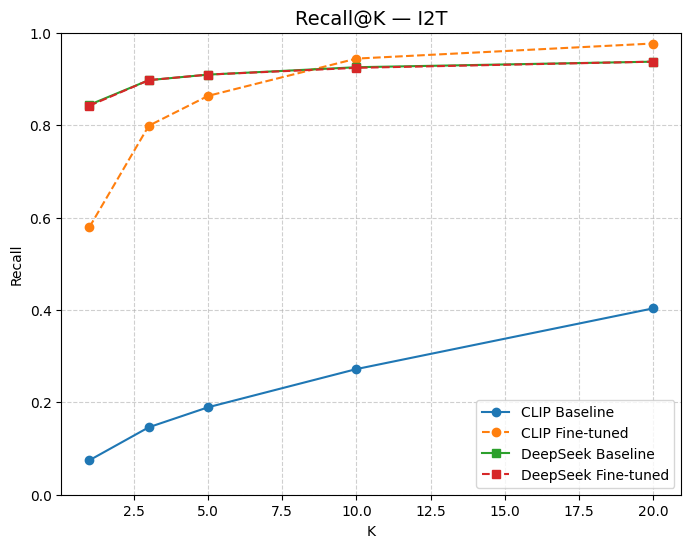

In [ ]:
plot_full_benchmark(
    metrics_clip_base=metrics_clip_baseline,
    metrics_clip_ft=metrics_clip_finetuned,
    metrics_deepseek_base=metrics_deepseek,
    metrics_deepseek_ft=metrics_deepseek_ft,
    direction="I2T"   # or "I2T"
)

# Side-by-side Retrievals

In [ ]:
def compare_clip_deepseek_caption_to_image(txt_idx, clip_sim_matrix, ds_sim_matrix, dataset_split, top_k=5):

    from IPython.display import display, HTML
    import base64
    from io import BytesIO
    import numpy as np

    def image_to_base64(pil_img):
        buffered = BytesIO()
        pil_img.save(buffered, format="PNG")
        img_b64 = base64.b64encode(buffered.getvalue()).decode()
        return f"data:image/png;base64,{img_b64}"

    query_caption = dataset_split[int(txt_idx)]["caption"]
    top_clip = np.argsort(-clip_sim_matrix[txt_idx])[:top_k]
    top_ds   = np.argsort(-ds_sim_matrix[txt_idx])[:top_k]

    html = f"<h3> Query Caption #{txt_idx}:</h3><p>{query_caption}</p>"
    html += f"<h4> Top {top_k} Retrieved Images</h4>"
    html += "<table><tr><th>CLIP</th><th>DeepSeek</th></tr>"

    for i in range(top_k):
        idx_clip = int(top_clip[i])
        idx_ds   = int(top_ds[i])

        img_clip = dataset_split[idx_clip]["image"].convert("RGB")
        img_ds   = dataset_split[idx_ds]["image"].convert("RGB")

        flag_clip = "Correct" if idx_clip == int(txt_idx) else "Wrong"
        flag_ds   = "Correct" if idx_ds == int(txt_idx) else "Wrong"

        img_html_clip = f"<img src='{image_to_base64(img_clip)}' width='256' />"
        img_html_ds   = f"<img src='{image_to_base64(img_ds)}' width='256' />"

        html += f"<tr><td>{img_html_clip}<br><center>{flag_clip} #{idx_clip}</center></td>"
        html += f"<td>{img_html_ds}<br><center>{flag_ds} #{idx_ds}</center></td></tr>"

    html += "</table>"
    display(HTML(html))

CLIP,DeepSeek
Correct #7,Wrong #555
Wrong #341,Wrong #488
Wrong #730,Wrong #484
Wrong #978,Wrong #116
Wrong #58,Wrong #158

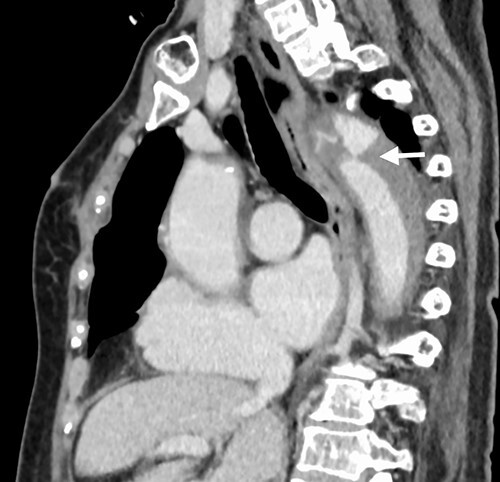
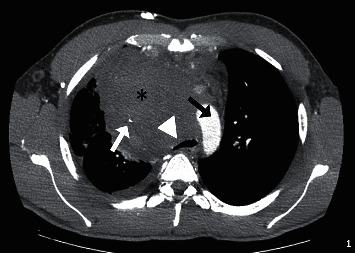
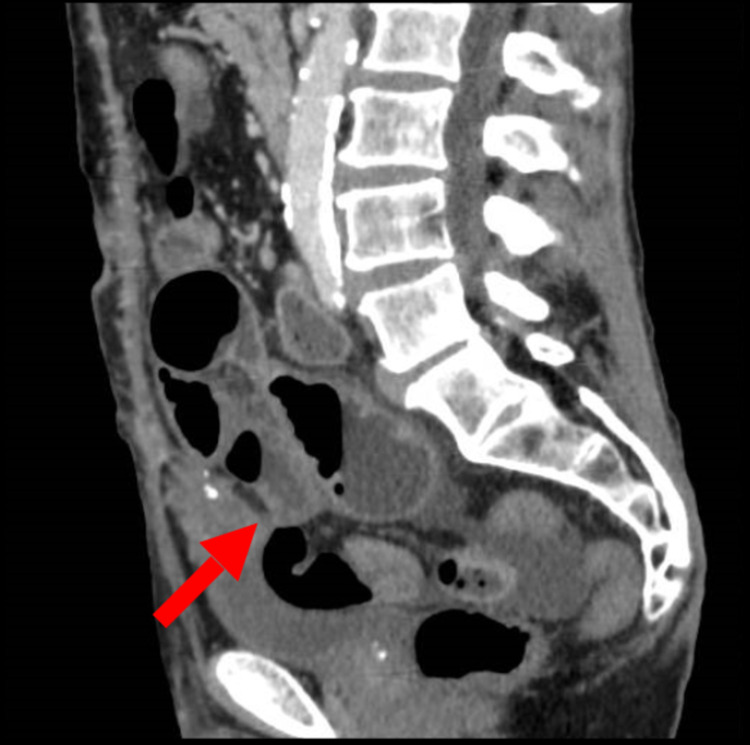
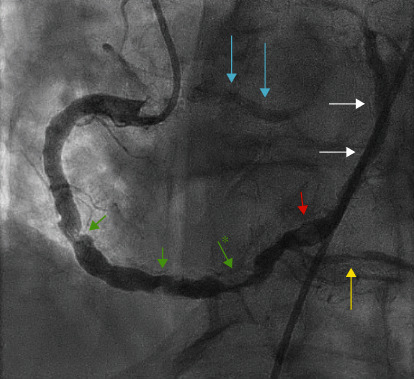
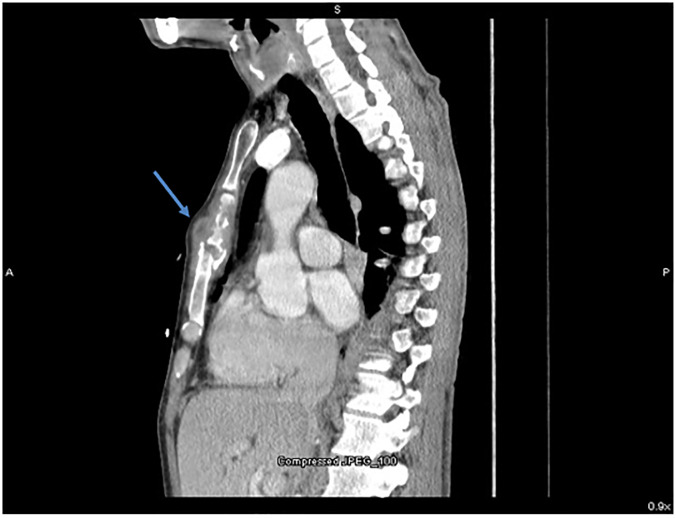
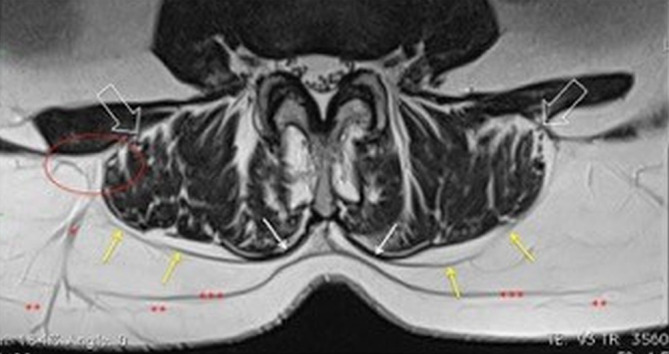
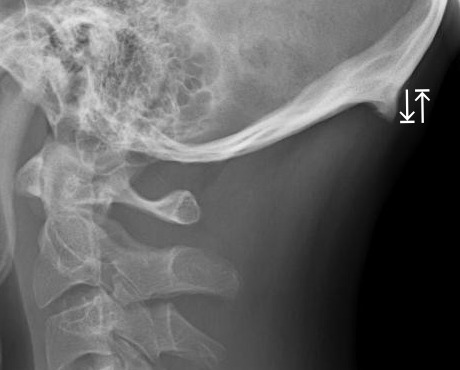
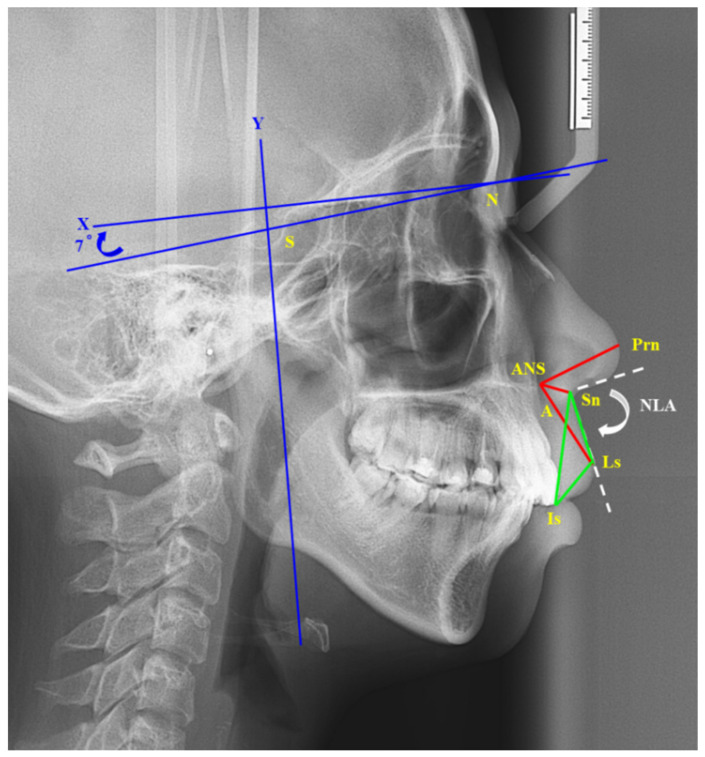
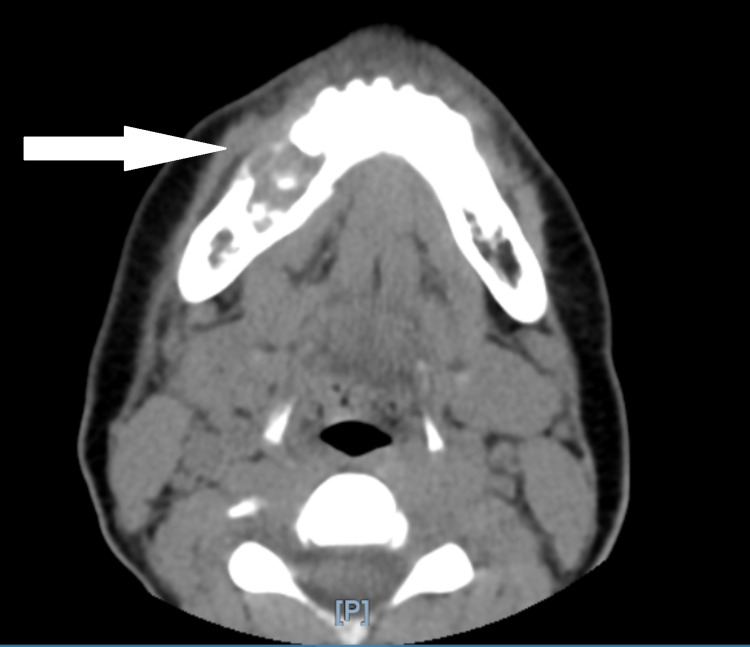
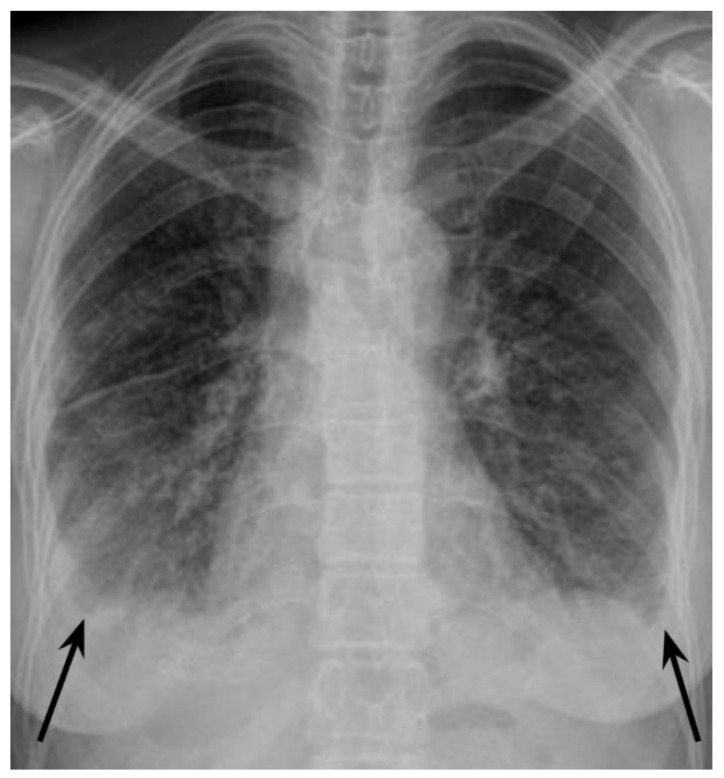

In [ ]:
compare_clip_deepseek_caption_to_image(
    txt_idx=7,
    clip_sim_matrix=sims_t2i_clip_finetuned,
    ds_sim_matrix=sims_t2i_deepseek,
    dataset_split=test_1000,
    top_k=5
)

In [ ]:
def compare_clip_deepseek_image_to_caption(img_idx, clip_sim_matrix, ds_sim_matrix, dataset_split, top_k=5):

    from IPython.display import display, HTML
    import base64
    from io import BytesIO
    import numpy as np

    def image_to_base64(pil_img):
        buffered = BytesIO()
        pil_img.save(buffered, format="PNG")
        img_b64 = base64.b64encode(buffered.getvalue()).decode()
        return f"data:image/png;base64,{img_b64}"

    # Ensure base index type
    img_idx = int(img_idx)

    # Display the query image
    query_image = dataset_split[img_idx]["image"].convert("RGB")

    # Get top-k predictions
    top_clip = np.argsort(-clip_sim_matrix[img_idx])[:top_k]
    top_ds   = np.argsort(-ds_sim_matrix[img_idx])[:top_k]

    html = f"<h3> Query Image #{img_idx}:</h3>"
    html += f"<img src='{image_to_base64(query_image)}' width='256' />"
    html += f"<h4> Top {top_k} Retrieved Captions</h4>"
    html += "<table><tr><th>CLIP</th><th>DeepSeek</th></tr>"

    for i in range(top_k):
        idx_clip = int(top_clip[i])
        idx_ds   = int(top_ds[i])

        cap_clip = dataset_split[idx_clip]["caption"]
        cap_ds   = dataset_split[idx_ds]["caption"]

        # Determine correctness
        flag_clip = "Correct" if idx_clip == img_idx else "Wrong"
        flag_ds   = "Correct" if idx_ds == img_idx else "Wrong"

        html += (
            f"<tr><td><b>{flag_clip} #{idx_clip}</b>: {cap_clip}</td>"
            f"<td><b>{flag_ds} #{idx_ds}</b>: {cap_ds}</td></tr>"
        )

    html += "</table>"
    display(HTML(html))

CLIP,DeepSeek
Wrong #578: Large hemorrhagic mass,"Correct #0: Chest X-ray showing enlarged cardiac silhouette with cardiothoracic ratio of 70%, and mild pulmonary congestion."
"Correct #0: Chest X-ray showing enlarged cardiac silhouette with cardiothoracic ratio of 70%, and mild pulmonary congestion.",Wrong #54: Pelvic CT scan. The scan shows loculated prostatic abscesses (dashed circle).
"Wrong #1269: MIP image from whole-body 18F-FDG-PET/CT demonstrates claw-shaped asymmetrical right sided, multi-segmental intense linear 18F-FDG uptake, in the distribution of C5 to T1 nerve roots of the brachial plexus (straight arrow) and nodal recurrence below the diaphragm (curved arrow)",Wrong #336: Anteroposterior radiographic image of a pelvis demonstrating bone edema (red arrow) and sclerotic changes in the pubic symphysis consistent with osteitis pubis.
Wrong #1046: Enhancemed computed tomography revealed a low density mass shadow (orange arrow) with a distinct boundary in the anterior and superior segment of the right lobe of liver.,"Wrong #36: CT Chest image after receiving chemotherapy showed cystic change in the parenchymal nodule (yellow arrow), with right-sided surgical emphysema (green arrow) and right-sided ICT in situ (red arrow). A lesion can also be seen in the left breast (orange arrow)."
Wrong #262: Post-marsupialization CT of the mandible,Wrong #425: Computed tomography of the lung on postoperative day 1 showing bilateral ground-glass opacities (black arrow)

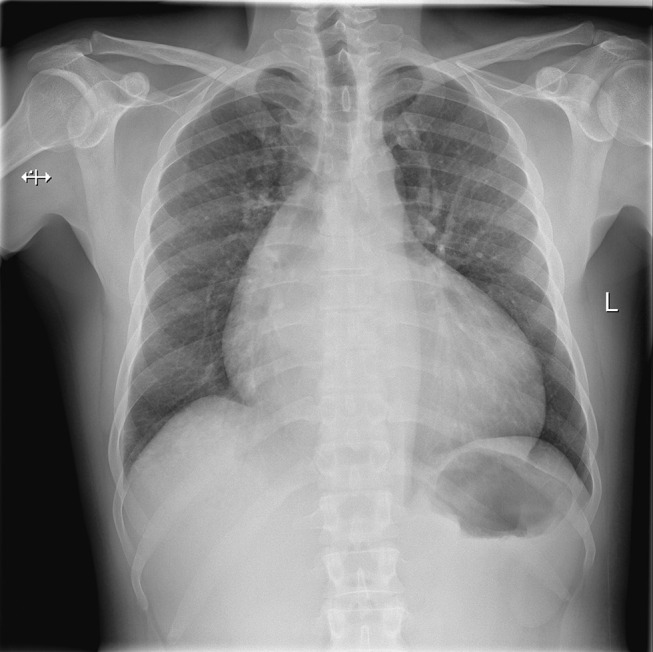

In [ ]:
compare_clip_deepseek_image_to_caption(
    img_idx=0,
    clip_sim_matrix=sims_i2t_clip_finetuned,
    ds_sim_matrix=sims_i2t_deepseek,
    dataset_split=val_1000,
    top_k=5
)